## ***Let's understand Analysis of Variance(ANOVA)***

##### The objective for creating this notebook is to build understanding of ANOVA by working on some real examples; 
- Post-Hoc tests 
- Normality tests
- Hommogenity tests
---

##### **Notebook Contents**

1. [Notes and Cheatsheet](#Notes_CheatSheet)
2. [Import required packages](#Importing_Libraries)
3. [`CASE STUDY - 1` :: Working with India's Population & COVID-19 datasets](#CASE_STUDY:1)
4. [`CASE STUDY - 2` :: Anger Management Dataset](#CASE_STUDY:2)
5. [Self QnA : 1](#Self_Question:1)
    1. [Experiment - A : Using random data](#Exp-A1)
    2. [Experiment - B : Using Anger Management data](#Exp-A2)
    
---

#### **Notes_CheatSheet**

In [1]:
from IPython.core.display import Image

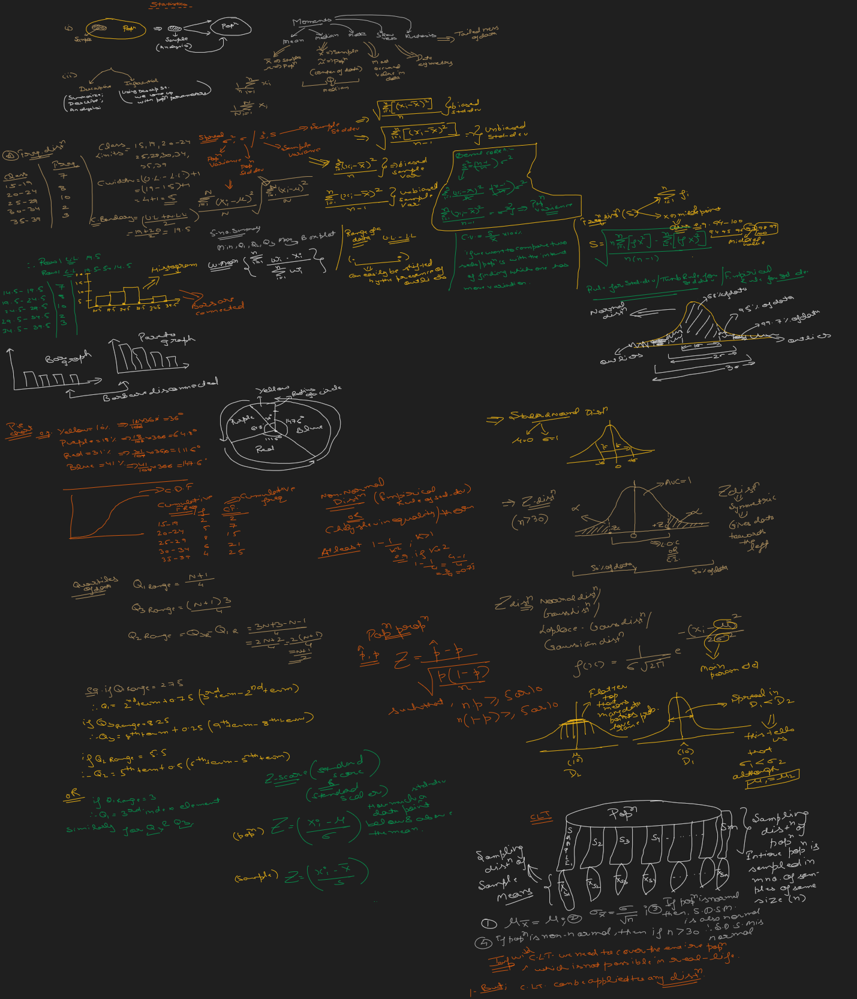

In [2]:
Image(filename="Handwritten_Notes/Stats_Revision-1.png",width=1800,height=1800)

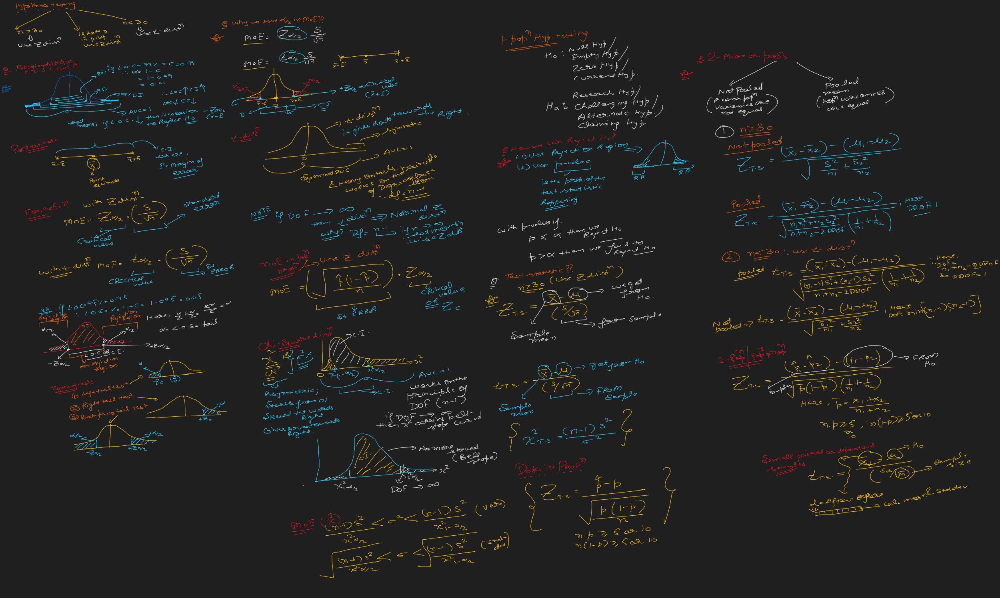

In [3]:
Image(filename="Handwritten_Notes/Stats_Revision-2.png",width=1800,height=1800)

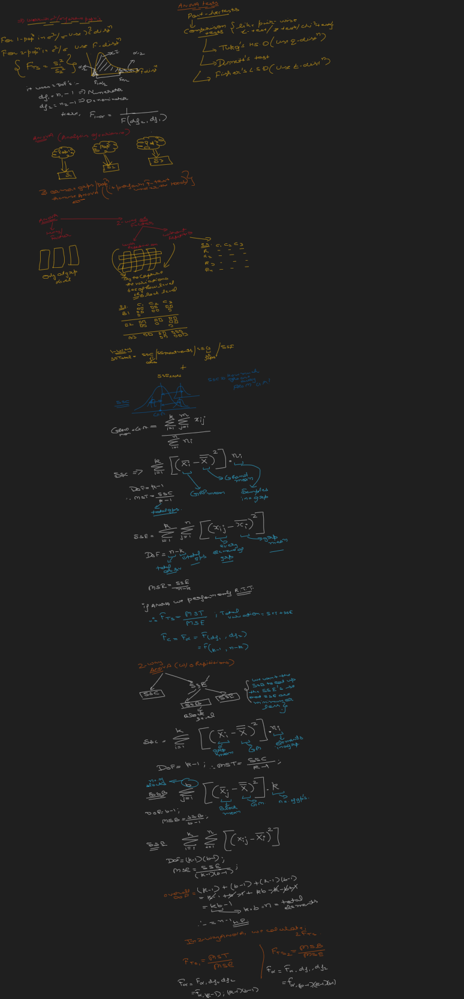

In [4]:
Image(filename="Handwritten_Notes/Stats_Revision-3.png",width=1800,height=1800)

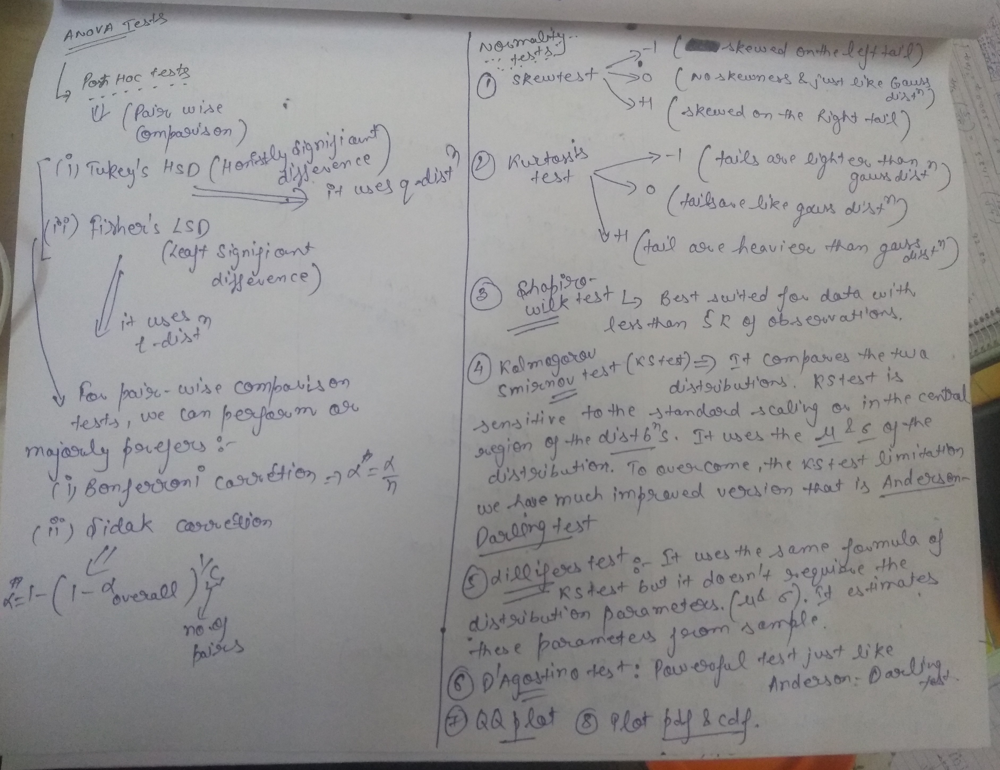

In [245]:
Image(filename="Handwritten_Notes/Stats_Tests_Cheatsheet1.jpg",width=1800,height=1800)

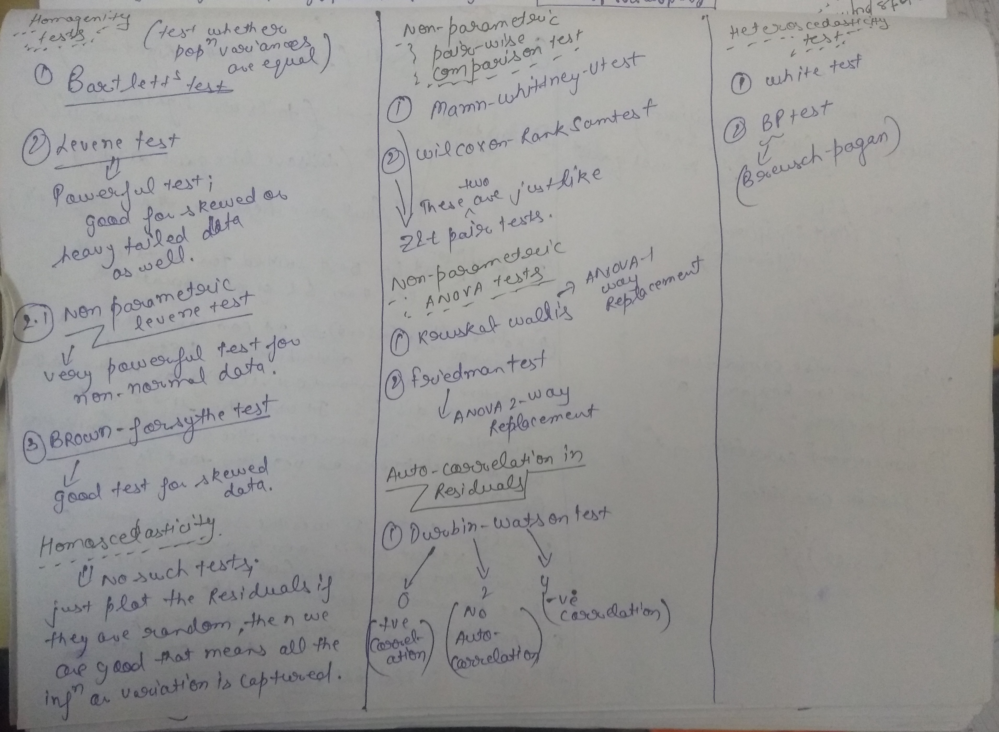

In [246]:
Image(filename="Handwritten_Notes/Stats_Tests_Cheatsheet2.jpg",width=1800,height=1800)

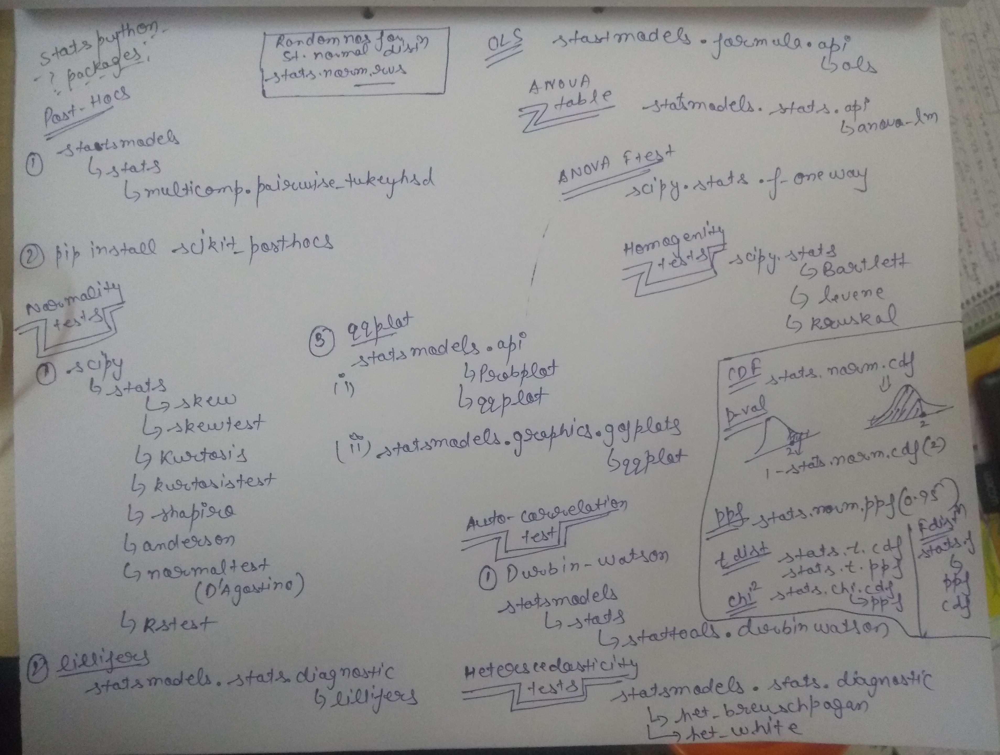

In [247]:
Image(filename="Handwritten_Notes/Stats_Tests_Python_Pkgs_Cheatsheet.jpg",width=1800,height=1800)

#### **Importing_Libraries**

In [5]:
## Data-preprocessing and visualization libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Colored print statements on the console
from termcolor import colored

## Feature scalers and transformers
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer

## Scientific python and statistical packages
import scipy
import statsmodels as stm

## QQ plot
from statsmodels.api import ProbPlot, qqplot
from statsmodels.graphics.gofplots import qqplot
## Lillifers
from statsmodels.stats.diagnostic import lilliefors
## Ordinary Least Squares
from statsmodels.formula.api import ols
## ANOVA Table
from statsmodels.stats.api import anova_lm 
## POST-Hoc Tests
from statsmodels.stats.multicomp import pairwise_tukeyhsd as tukeyhsd
import scikit_posthocs as post_hocs
## HETEROSCADASTICITY Tests
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.diagnostic import het_white

%matplotlib inline

In [6]:
pd.set_option('display.max_rows',50)

#### **``CASE_STUDY:1``**
##### **Working with India's Population & COVID-19 datasets**

In [7]:
state_dly_cases = pd.read_csv("Datasets/covid_19_india.csv")

In [8]:
state_dly_cases.tail()

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
8481,8482,16/11/20,8:00 AM,Telengana,-,-,242084,1407,257876
8482,8483,16/11/20,8:00 AM,Tripura,-,-,30555,364,31962
8483,8484,16/11/20,8:00 AM,Uttarakhand,-,-,62543,1107,68215
8484,8485,16/11/20,8:00 AM,Uttar Pradesh,-,-,480965,7372,511304
8485,8486,16/11/20,8:00 AM,West Bengal,-,-,394576,7661,431551


In [9]:
state_ws_test = pd.read_csv("Datasets/StatewiseTestingDetails.csv")

In [10]:
state_ws_test.tail()

,Date,State,TotalSamples,Negative,Positive
7307,2020-11-11,West Bengal,5047335.0,NaN,NaN
7308,2020-11-12,West Bengal,5091700.0,NaN,NaN
7309,2020-11-13,West Bengal,5136012.0,NaN,NaN
7310,2020-11-14,West Bengal,5180139.0,NaN,NaN
7311,2020-11-15,West Bengal,5218797.0,NaN,NaN


In [11]:
state_ws_test.shape

(7312, 5)

In [12]:
india_pop = pd.read_csv("Datasets/population_india_census2011.csv.txt")

In [13]:
india_pop.head()

,Sno,State / Union Territory,Population,Rural population,Urban population,Area,Density,Gender Ratio
0,1,Uttar Pradesh,199812341,155317278,44495063,"240,928 km2 (93,023 sq mi)","828/km2 (2,140/sq mi)",912
1,2,Maharashtra,112374333,61556074,50818259,"307,713 km2 (118,809 sq mi)",365/km2 (950/sq mi),929
2,3,Bihar,104099452,92341436,11758016,"94,163 km2 (36,357 sq mi)","1,102/km2 (2,850/sq mi)",918
3,4,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
4,5,Madhya Pradesh,72626809,52557404,20069405,"308,245 km2 (119,014 sq mi)",236/km2 (610/sq mi),931


In [14]:
india_pop.shape

(36, 8)

##### **Merging the State Population and State wise testing dataframes**

In [15]:
np.count_nonzero(state_ws_test['State'].unique())

35

In [16]:
np.count_nonzero(india_pop['State / Union Territory'].unique())

36

In [17]:
set(india_pop['State / Union Territory'].unique()) - set(state_ws_test['State'].unique())

{'Lakshadweep', 'Telengana'}

In [18]:
np.sort(india_pop['State / Union Territory'].unique())

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Dadra and Nagar Haveli and Daman and Diu',
       'Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh',
       'Jammu and Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh',
       'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry',
       'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telengana',
       'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'],
      dtype=object)

In [19]:
np.sort(state_ws_test['State'].unique())

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Dadra and Nagar Haveli and Daman and Diu',
       'Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh',
       'Jammu and Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh',
       'Madhya Pradesh', 'Maharashtra', 'Manipur', 'Meghalaya', 'Mizoram',
       'Nagaland', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan',
       'Sikkim', 'Tamil Nadu', 'Telangana', 'Tripura', 'Uttar Pradesh',
       'Uttarakhand', 'West Bengal'], dtype=object)

##### **Here, I found out that ``State wise COVID testing dataset`` has no information about testing carried out in ``Lakshadweep``. And, ``Telangana`` spelling is incorrect in ``Indian Pop dataset``.**

In [20]:
india_pop['State / Union Territory'] = india_pop['State / Union Territory'].\
apply(lambda state: 'Telangana' if state == 'Telengana' else state)

In [21]:
set(india_pop['State / Union Territory'].unique()) - set(state_ws_test['State'].unique()) 

{'Lakshadweep'}

In [22]:
pop_test_df = pd.merge(left=state_ws_test.copy(deep=True),right=india_pop.copy(deep=True),
                       left_on='State',right_on='State / Union Territory',how='outer')

In [23]:
pop_test_df.shape

(7313, 13)

In [24]:
pop_test_df.tail()

,Date,State,TotalSamples,Negative,Positive,Sno,State / Union Territory,Population,Rural population,Urban population,Area,Density,Gender Ratio
7308,2020-11-12,West Bengal,5091700.0,NaN,NaN,4,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7309,2020-11-13,West Bengal,5136012.0,NaN,NaN,4,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7310,2020-11-14,West Bengal,5180139.0,NaN,NaN,4,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7311,2020-11-15,West Bengal,5218797.0,NaN,NaN,4,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7312,NaN,NaN,NaN,NaN,NaN,36,Lakshadweep,64473,14141,50332,32 km2 (12 sq mi),"2,013/km2 (5,210/sq mi)",946


##### **Getting rid of few features :: ``Sno`` as it is a dummy running sequence number and ``State`` as we already have ``State / Union Territory`` providing the same information.** 

In [25]:
pop_test_df.drop(labels=['Sno','State'],axis=1,inplace=True)

##### **Renaming ``State / Union Territory`` as ``State``.**

In [26]:
pop_test_df.rename(columns={'State / Union Territory':'State'},inplace=True)

In [27]:
pd.concat([pop_test_df.head(3),pop_test_df.tail(3)],axis=0)

,Date,TotalSamples,Negative,Positive,State,Population,Rural population,Urban population,Area,Density,Gender Ratio
0,2020-04-17,1403.0,1210,12.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876
1,2020-04-24,2679.0,NaN,27.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876
2,2020-04-27,2848.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876
7310,2020-11-14,5180139.0,NaN,NaN,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7311,2020-11-15,5218797.0,NaN,NaN,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953
7312,NaN,NaN,NaN,NaN,Lakshadweep,64473,14141,50332,32 km2 (12 sq mi),"2,013/km2 (5,210/sq mi)",946


##### **Generating the "Density in km2" Feature from Density variable**

In [28]:
pop_test_df['Density in km2'] = pop_test_df['Density'].apply(lambda row : np.float(row.split('/')[0].replace(",",'')))

In [29]:
## Printing some of the top &  bottom records
pd.concat([pop_test_df.head(3),pop_test_df.tail(3)],axis=0)

,Date,TotalSamples,Negative,Positive,State,Population,Rural population,Urban population,Area,Density,Gender Ratio,Density in km2
0,2020-04-17,1403.0,1210,12.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0
1,2020-04-24,2679.0,NaN,27.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0
2,2020-04-27,2848.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0
7310,2020-11-14,5180139.0,NaN,NaN,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0
7311,2020-11-15,5218797.0,NaN,NaN,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0
7312,NaN,NaN,NaN,NaN,Lakshadweep,64473,14141,50332,32 km2 (12 sq mi),"2,013/km2 (5,210/sq mi)",946,2013.0


In [30]:
def font_dicts(kind=['xlabel','ylabel','title']):
    """
    Description: This function is created for defining the font dictionaries of labels and titles for plots.
    
    Input parameters: It accepts only one below agrument:
            1. kind : Can take one of values --> ['xlabel','ylabel','title']
    
    Retuns: fdict with values of 'size', 'family' and 'color'
    """
    try:
        if kind == 'xlabel':
            fdict = {'size':16,'family':'calibri','style':'oblique','color':'blue'}
        elif kind == 'ylabel':
            fdict = {'size':16,'family':'calibri','style':'oblique','color':'k'}
        elif kind == 'title':
            fdict = {'size':17,'family':'calibri','style':'oblique','color':'brown'}
        else:
            fdict = {'size':16,'family':'calibri','style':'oblique','color':'k'}
    except ValueError as err:
        pass
    return fdict

In [31]:
## Generating States Density dataframe
state_density_df = pop_test_df.groupby(['State'])[['Density in km2']].max().reset_index()

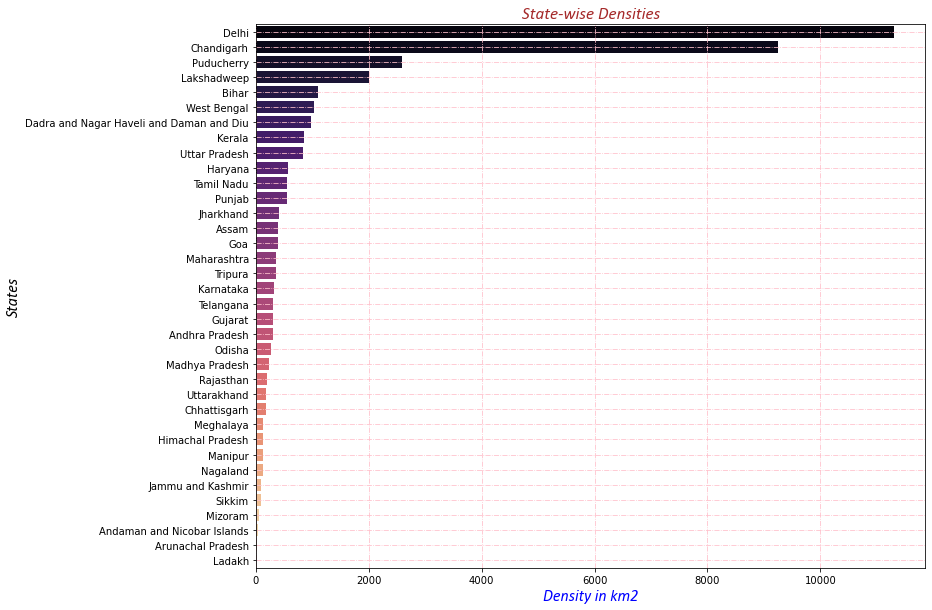

In [32]:
with plt.style.context('seaborn-bright'):
    plt.figure(figsize=(12,10))
    sns.barplot(data=state_density_df.sort_values(by='Density in km2',ascending=False),y='State',x='Density in km2',
                orient='h',palette='magma')
    plt.grid(which='major',linestyle='-.',color='pink')
    plt.title('State-wise Densities',fontdict=font_dicts(kind='title'))
    plt.ylabel('States',fontdict=font_dicts(kind='ylabel'))
    plt.xlabel('Density in km2',fontdict=font_dicts(kind='xlabel'))
    plt.show()

##### **``'Delhi'`` and ``'Chandigarh'`` totally stands out in this plot with the highest densities values.**

In [33]:
def dense_groups(density=0):
    """
    Description: This function defines the density group based on the state's density value.
    Input: It accepts only one parameter -- density (by default its 0)
    Return: Returns the density group name.
    """
    try:
        if 0<density<=300:
            grp_name = 'Dense1'
        elif 300<density<=600:
            grp_name = 'Dense2' 
        elif 600<density<=900:
            grp_name = 'Dense3'
        elif 900<density<=1200:
            grp_name = 'Dense4'
        else:
            grp_name = 'Dense5'
    except ValueError as err:
        pass
    return grp_name

In [34]:
## Generating Density Group Feature 
pop_test_df['Dense_grp'] = list(map(dense_groups,pop_test_df['Density in km2']))

In [35]:
pop_test_df.head()

,Date,TotalSamples,Negative,Positive,State,Population,Rural population,Urban population,Area,Density,Gender Ratio,Density in km2,Dense_grp
0,2020-04-17,1403.0,1210,12.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
1,2020-04-24,2679.0,NaN,27.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
2,2020-04-27,2848.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
3,2020-05-01,3754.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
4,2020-05-16,6677.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1


In [36]:
state_ws_nulls_in_pos = pop_test_df[pop_test_df['Positive'].isna()].groupby(['State'])[['State']].count().\
rename(columns={'State':'Nulls_in_pos'}).reset_index()

In [37]:
state_ws_nulls_in_pos

,State,Nulls_in_pos
0,Andaman and Nicobar Islands,1
1,Andhra Pradesh,98
2,Arunachal Pradesh,93
3,Assam,87
4,Bihar,96
5,Chandigarh,92
6,Chhattisgarh,88
7,Dadra and Nagar Haveli and Daman and Diu,19
8,Delhi,98
9,Goa,90


In [38]:
state_ws_nulls_in_pos['Nulls_in_pos'].mean()

73.0

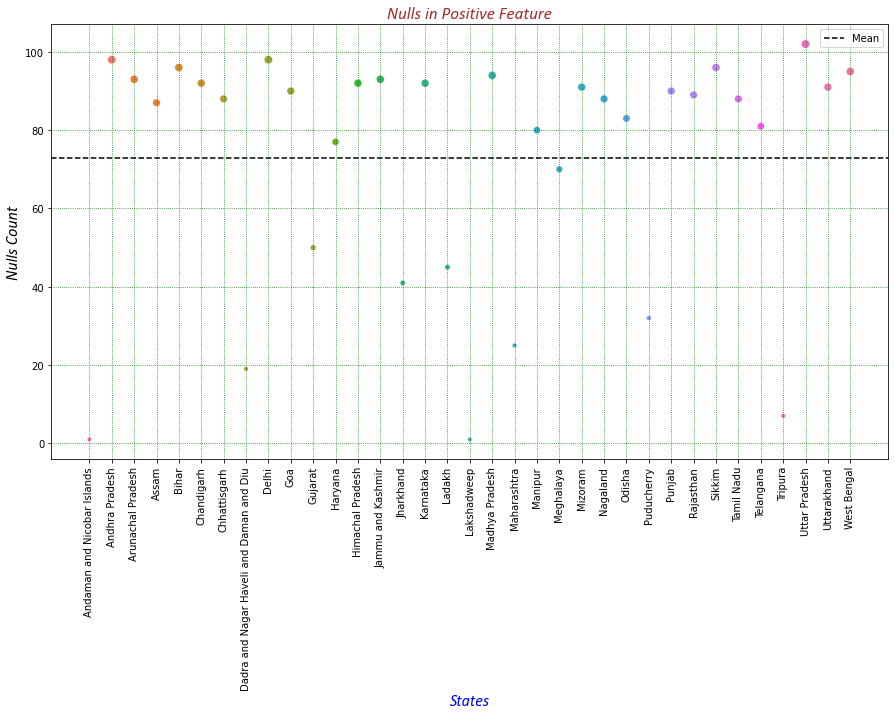

In [39]:
with plt.style.context('seaborn-bright'):
    plt.figure(figsize=(15,8))
    sns.scatterplot(data=state_ws_nulls_in_pos,x='State',y='Nulls_in_pos',size=((state_ws_nulls_in_pos['Nulls_in_pos']*.1)**2),hue='State',legend=False)
    plt.axhline(y=state_ws_nulls_in_pos['Nulls_in_pos'].mean(),linestyle='--',color='k',label='Mean')
    plt.xticks(rotation=90)
    plt.ylabel("Nulls in Positive", fontdict={'size':19,'family':'calibri','style':'normal'})
    plt.grid(which='major',linestyle=':',color='g')
    plt.title('Nulls in Positive Feature',fontdict=font_dicts(kind='title'))
    plt.xlabel('States',fontdict=font_dicts(kind='xlabel'))
    plt.ylabel('Nulls Count',fontdict=font_dicts(kind='ylabel'))
    plt.legend()

##### **Here, although we have some states where Nulls in the positive are less than the entire mean but overall we can say that majority of the states have same number of NULLS in the positive cases.**

In [40]:
pop_test_df.head()

,Date,TotalSamples,Negative,Positive,State,Population,Rural population,Urban population,Area,Density,Gender Ratio,Density in km2,Dense_grp
0,2020-04-17,1403.0,1210,12.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
1,2020-04-24,2679.0,NaN,27.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
2,2020-04-27,2848.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
3,2020-05-01,3754.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
4,2020-05-16,6677.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1


In [41]:
def plot_hist_kde(d_frame,grp_by_col,dist_col,title=None):
    """
    Description: This function plot the distribution of data
    
    Input Parameters: It accepts below arguments:
            1. d_frame : Dataset of type pandas dataframe
            2. grp_by_col : Column for grouping the data of several states
            3. dist_col : Column whose data distribution to be visualized
            4. title : Title of the plot
    
    Return: None
    """
    all_states = d_frame[grp_by_col].unique()
    with plt.style.context('seaborn'):
        for state in all_states:
            plt.figure(figsize=(8,5))
            d_frame[d_frame[grp_by_col] == state][dist_col].plot(kind='hist',density=True,color='lightblue')
            sns.kdeplot(data=d_frame[d_frame[grp_by_col] == state][dist_col],color='coral',legend=False)
            plt.axvline(d_frame[d_frame[grp_by_col] == state][dist_col].mean(),linestyle='--',color='purple')
            plt.axvline(d_frame[d_frame[grp_by_col] == state][dist_col].median(),linestyle=':',color='black')
            plt.title(title,fontdict=font_dicts(kind='title'))
            plt.xlabel(state,fontdict=font_dicts(kind='xlabel'))
            plt.ylabel('Frequency',fontdict=font_dicts(kind='ylabel'))
            plt.xticks(size=13)
            plt.yticks(size=13)
            plt.legend(("Kde","Mean","Median"))
            plt.show()

Positive cases distribution: Before filling NA's


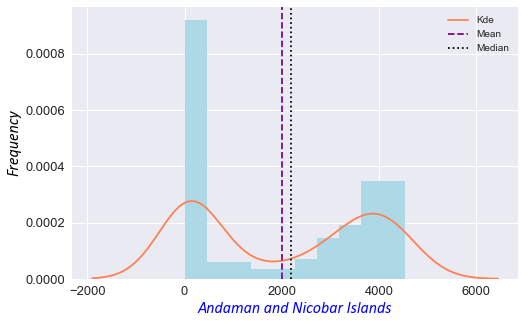

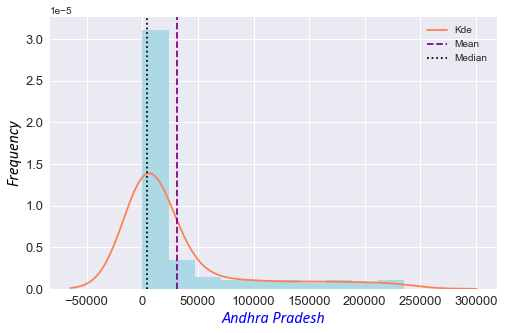

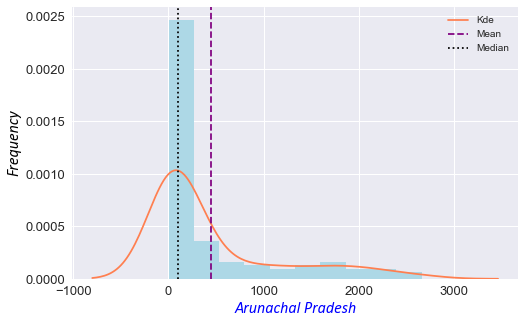

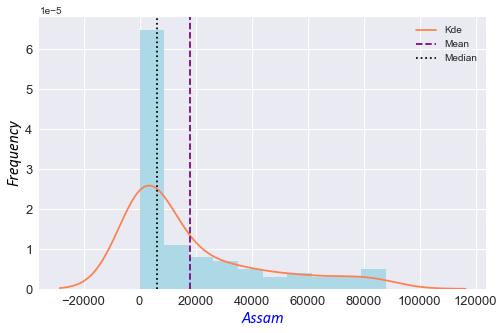

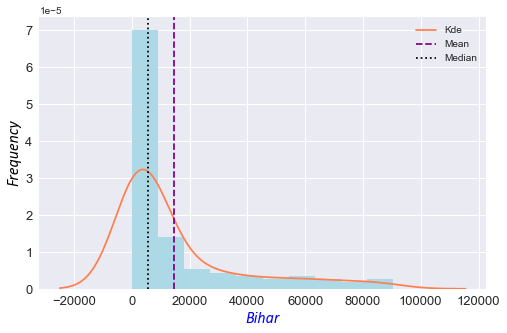

...

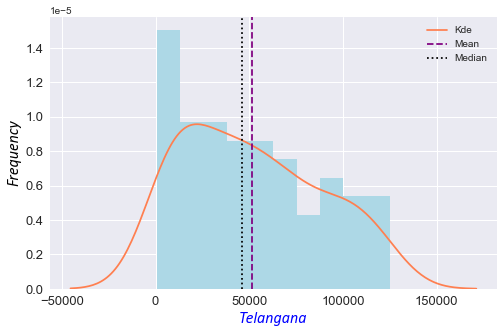

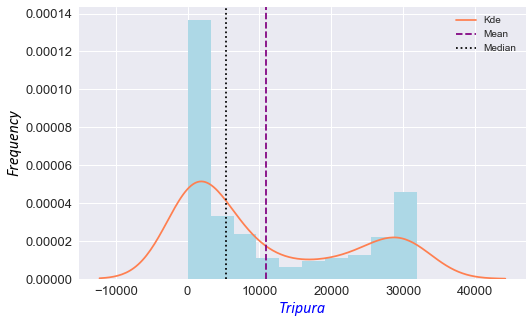

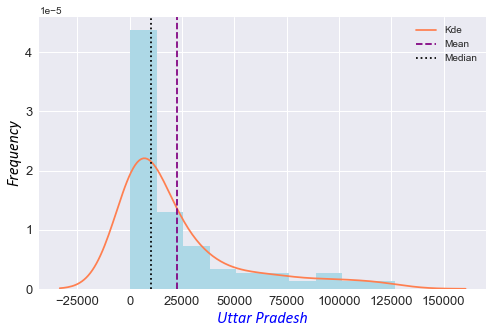

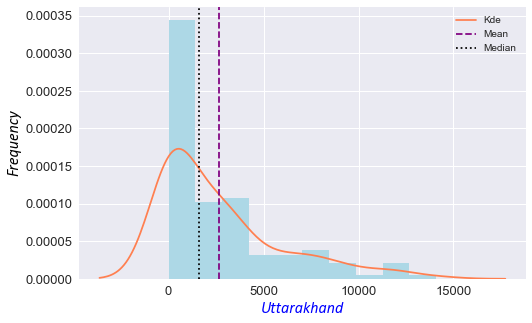

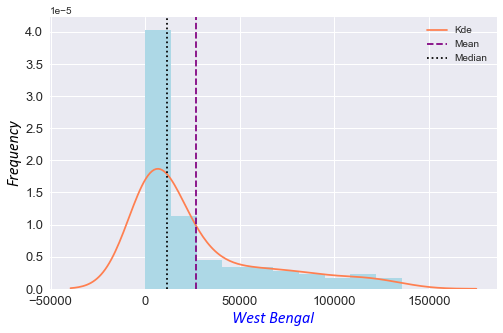

c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\numpy\lib\histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


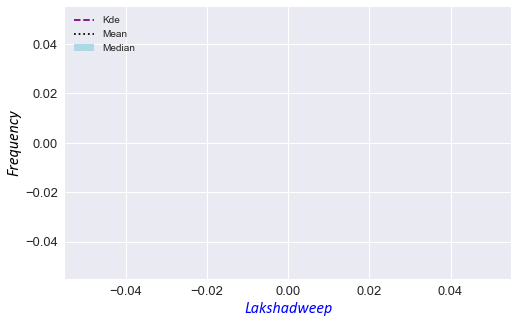

In [42]:
## Plotting the State-wise distributions of Positives before performing the simple imputation
print(colored("Positive cases distribution:",'red'),colored("Before filling NA's",'green'))
plot_hist_kde(pop_test_df,grp_by_col='State',dist_col='Positive')

##### By seeing the above plots we are going ahead with Simple Imputation using Median.

##### **Imputing NULL values in 'Positive' statewise**

In [43]:
## Calculating median of every state
states_pop_median = pop_test_df.groupby(['State'])[['Positive']].median().reset_index().rename(columns={'Positive':'Pos_Median'})

In [44]:
states_pop_median

,State,Pos_Median
0,Andaman and Nicobar Islands,2186.0
1,Andhra Pradesh,4126.0
2,Arunachal Pradesh,101.0
3,Assam,6067.5
4,Bihar,5695.0
5,Chandigarh,334.0
6,Chhattisgarh,1905.0
7,Dadra and Nagar Haveli and Daman and Diu,495.0
8,Delhi,32810.0
9,Goa,629.0


##### **Filling the missing value fpr `Lakshadweep`**

In [45]:
states_pop_median['Pos_Median'].fillna(value=states_pop_median['Pos_Median'].median(),inplace=True)
states_pop_median

,State,Pos_Median
0,Andaman and Nicobar Islands,2186.0
1,Andhra Pradesh,4126.0
2,Arunachal Pradesh,101.0
3,Assam,6067.5
4,Bihar,5695.0
5,Chandigarh,334.0
6,Chhattisgarh,1905.0
7,Dadra and Nagar Haveli and Daman and Diu,495.0
8,Delhi,32810.0
9,Goa,629.0


In [46]:
## Imputing Median for every state
pop_test_df['Positive'] = pop_test_df[['State','Positive']].\
apply(lambda row: np.float(states_pop_median[states_pop_median['State'] == row['State']]['Pos_Median'])\
      if str(row['Positive']).lower() == str('NaN').lower() else row['Positive'],axis=1)

In [47]:
pop_test_df

,Date,TotalSamples,Negative,Positive,State,Population,Rural population,Urban population,Area,Density,Gender Ratio,Density in km2,Dense_grp
0,2020-04-17,1403.0,1210,12.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
1,2020-04-24,2679.0,NaN,27.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
2,2020-04-27,2848.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
3,2020-05-01,3754.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
4,2020-05-16,6677.0,NaN,33.0,Andaman and Nicobar Islands,380581,237093,143488,"8,249 km2 (3,185 sq mi)",46/km2 (120/sq mi),876,46.0,Dense1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7308,2020-11-12,5091700.0,NaN,11290.5,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0,Dense4
7309,2020-11-13,5136012.0,NaN,11290.5,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0,Dense4
7310,2020-11-14,5180139.0,NaN,11290.5,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0,Dense4
7311,2020-11-15,5218797.0,NaN,11290.5,West Bengal,91276115,62183113,29093002,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029.0,Dense4


Positive cases distribution: After Median Imputation


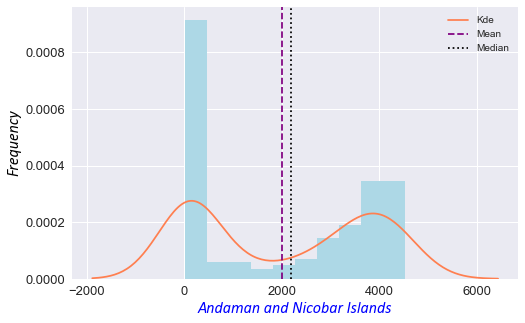

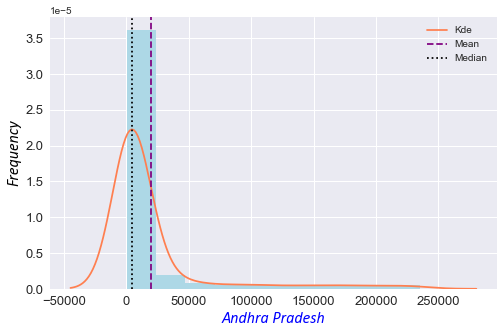

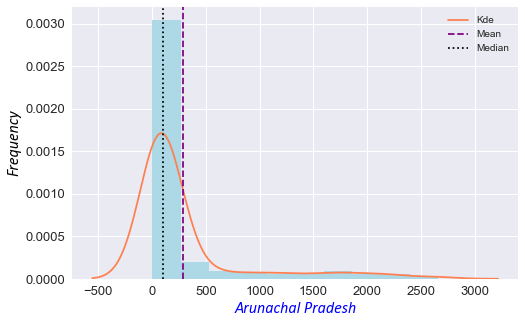

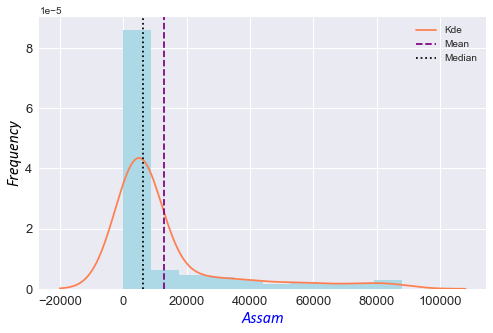

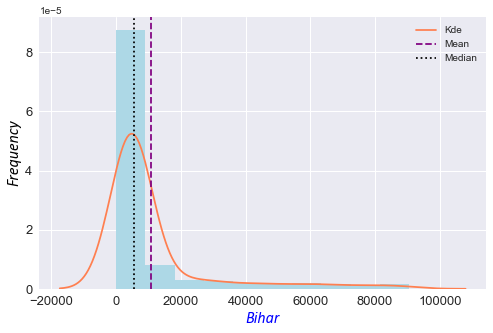

...

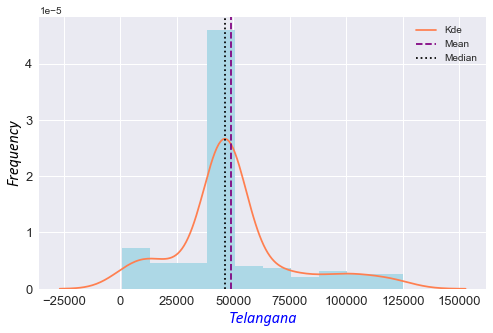

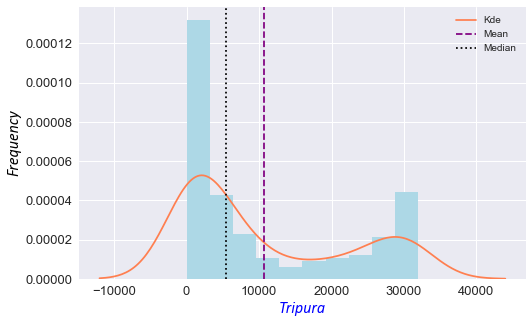

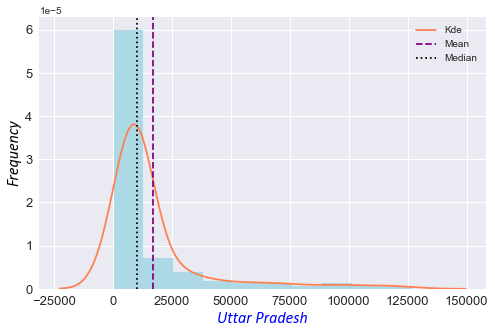

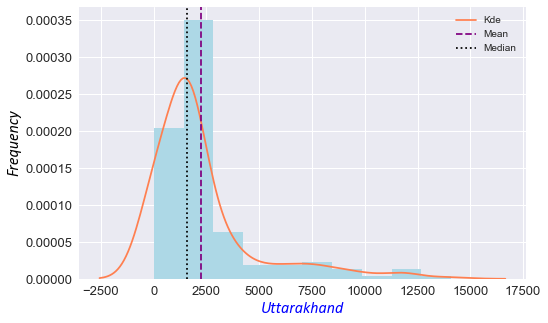

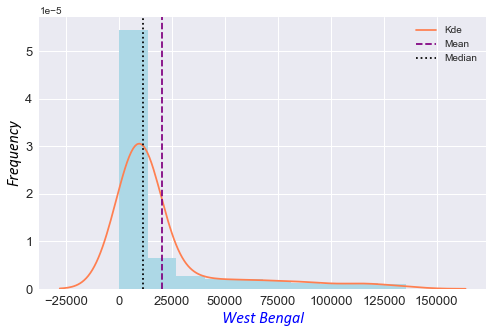

c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


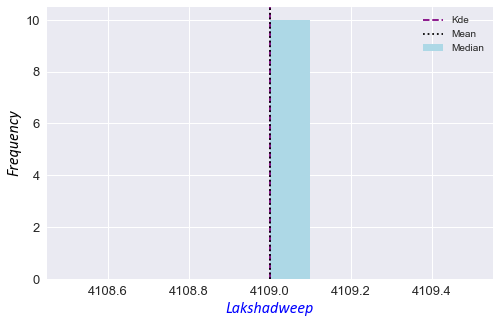

In [48]:
## Plotting the State-wise distributions of Positives after median imputation
print(colored("Positive cases distribution:",'red'),colored("After Median Imputation",'green'))
plot_hist_kde(pop_test_df,grp_by_col='State',dist_col='Positive')

##### **Overall Distribution of ``Positive`` cases**

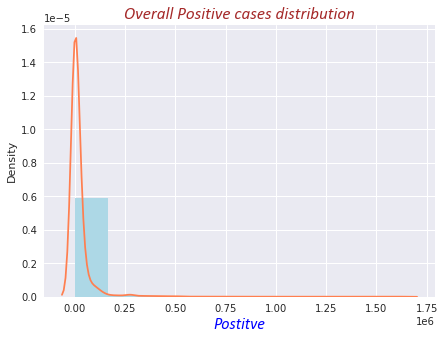

In [49]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(7,5))
    plt.hist(pop_test_df['Positive'],density=True,color='lightblue')
    sns.kdeplot(data=pop_test_df['Positive'],color='coral')
    plt.xlabel("Postitve",fontdict=font_dicts(kind='xlabel'))
    plt.title("Overall Positive cases distribution",fontdict=font_dicts(kind="title"));

##### **By seeing the above distribution, the first impression looks like 'Positive' follows the Power-Rule thus apply the PowerTransformer.** 

##### **Here, in the power transformer I have selected the method as ``'yeo-johnson'`` because ``'box-cox'`` strictly deals with positive values and it looks for the minimum value in the array should be grater than 0. However, in the ``'Positive'`` array the minimum value is 0, therefore going ahead with ``'yeo-johnson'``.**

##### **Checking the sign of values (-1 for negative, 1 for positive and 0 for 0)**

In [50]:
check_pos_signs = pd.DataFrame(np.sign(pop_test_df['Positive']))

In [51]:
check_pos_signs[check_pos_signs.Positive==0].shape

(77, 1)

In [52]:
check_pos_signs[check_pos_signs.Positive==1].shape

(7236, 1)

In [53]:
pop_test_df['Positive'].shape

(7313,)

In [54]:
check_pos_signs[check_pos_signs.Positive==0].shape[0]+check_pos_signs[check_pos_signs.Positive==1].shape[0]

7313

##### **The above results tells us that there are no negative values.**

In [55]:
## Return minimum of an array or minimum along an axis, ignoring any NaNs.
np.nanmin(pop_test_df['Positive'])

0.0

In [56]:
## Creating Dataset for 1-Factor ANOVA
annv1_dense_grp = pop_test_df[['Positive','Dense_grp']].iloc[0:-1,:].drop_duplicates().reset_index(drop=True)
annv1_dense_grp.shape

(3976, 2)

In [57]:
## Density groups wise number of positives
annv1_dense_grp

,Positive,Dense_grp
0,12.0,Dense1
1,27.0,Dense1
2,33.0,Dense1
3,35.0,Dense1
4,38.0,Dense1
...,...,...
3971,116498.0,Dense4
3972,119578.0,Dense4
3973,122753.0,Dense4
3974,132364.0,Dense4


In [58]:
## Checking NULLS in the 1-Factor ANOVA dataset
annv1_dense_grp['Positive'].isna().sum()

0

In [59]:
ss=StandardScaler()

#### **`Difference between sklearn and scipy power transformation`**

In [60]:
## Sklearn Power Transformer using method 'yeo-johnson' with default settings (standardize=True)
pt = PowerTransformer(method='yeo-johnson',standardize=True)

In [61]:
print(colored("Mean","green","on_yellow"),'::',np.round(np.mean(pt.fit_transform(annv1_dense_grp[['Positive']])),4))
print(colored("Std-dev","green","on_yellow"),'::',np.round(np.var(pt.fit_transform(annv1_dense_grp[['Positive']])),4))

Mean :: -0.0
Std-dev :: 1.0


##### This tells us that by default sklearn power transformer standardize the dataset with 0 centric mean and unit variance.

In [62]:
print(colored("Mean","green","on_yellow"),'::',np.round(np.mean(scipy.stats.yeojohnson(annv1_dense_grp['Positive'],lmbda=None)[0]),4))
print(colored("Mean","green","on_yellow"),'::',np.round(np.var(scipy.stats.yeojohnson(annv1_dense_grp['Positive'],lmbda=None)[0]),4))

Mean :: 9.2005
Mean :: 7.3033


In [63]:
## Sklearn Power Transformer using method 'yeo-johnson' with changed settings (standardize=False)
pt1 = PowerTransformer(method='yeo-johnson',standardize=False)
print(colored("Mean","green","on_yellow"),'::',np.round(np.mean(pt1.fit_transform(annv1_dense_grp[['Positive']])),4))
print(colored("Std-dev","green","on_yellow"),'::',np.round(np.var(pt1.fit_transform(annv1_dense_grp[['Positive']])),4))

Mean :: 9.2005
Std-dev :: 7.3033


##### Thus the sklearn power transformer standardize the dataset with 0 centric mean and unit variance by default and scipy returns the results with no standardization.

In [64]:
## Applying power transformed with standardization
annv1_dense_grp = pd.concat([annv1_dense_grp,pd.DataFrame(pt.fit_transform(annv1_dense_grp[['Positive']]),columns=['positive_pt'])],axis=1)

In [65]:
annv1_dense_grp

,Positive,Dense_grp,positive_pt
0,12.0,Dense1,-2.434070
1,27.0,Dense1,-2.135350
2,33.0,Dense1,-2.059129
3,35.0,Dense1,-2.036642
4,38.0,Dense1,-2.005114
...,...,...,...
3971,116498.0,Dense4,1.376988
3972,119578.0,Dense4,1.388798
3973,122753.0,Dense4,1.400664
3974,132364.0,Dense4,1.434825


In [66]:
## Creating 4 different dataframes of the density groups
pt_dense_grp1 = pd.DataFrame(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense1']['positive_pt']).rename(columns={'positive_pt':'pos_pt_dense1'})
pt_dense_grp2 = pd.DataFrame(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense2']['positive_pt']).rename(columns={'positive_pt':'pos_pt_dense2'})
pt_dense_grp3 = pd.DataFrame(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense3']['positive_pt']).rename(columns={'positive_pt':'pos_pt_dense3'})
pt_dense_grp4 = pd.DataFrame(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense4']['positive_pt']).rename(columns={'positive_pt':'pos_pt_dense4'})
pt_dense_grp5 = pd.DataFrame(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense5']['positive_pt']).rename(columns={'positive_pt':'pos_pt_dense5'})

##### **Check if any NAN's exist post Power Transformation**

In [67]:
pd.DataFrame({'Grp1':[pt_dense_grp1['pos_pt_dense1'].isna().sum()],
              'Grp2':[pt_dense_grp2['pos_pt_dense2'].isna().sum()],
              'Grp3':[pt_dense_grp3['pos_pt_dense3'].isna().sum()],
              'Grp4':[pt_dense_grp4['pos_pt_dense4'].isna().sum()],
              'Grp5':[pt_dense_grp5['pos_pt_dense5'].isna().sum()]})

,Grp1,Grp2,Grp3,Grp4,Grp5
0,0,0,0,0,0


Plotting Pre and Post Transformed distributions of groups


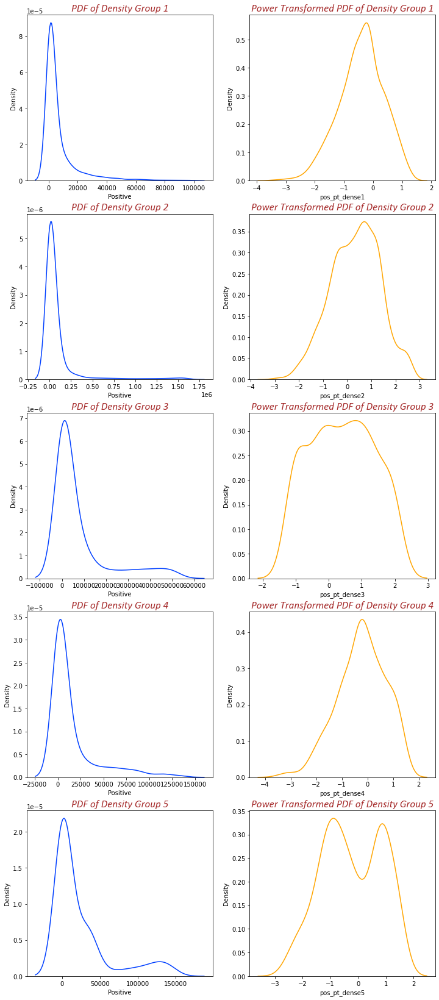

In [68]:
## Plotting pre and post power-transformed groups distributions
print(colored("Plotting Pre and Post Transformed distributions of groups","green","on_white"))
with plt.style.context('seaborn-bright'):
    fig , ax = plt.subplots(nrows=5,ncols=2,figsize=(12,29))
    sns.kdeplot(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense1']['Positive'],ax=ax[0,0],label='Grp-1')
    sns.kdeplot(pt_dense_grp1['pos_pt_dense1'],ax=ax[0,1],label='Power Trans Grp-1',color='orange')
    ax[0,0].set_title('PDF of Density Group 1',fontdict=font_dicts(kind='title'))
    ax[0,1].set_title('Power Transformed PDF of Density Group 1',fontdict=font_dicts(kind='title'))
    
    sns.kdeplot(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense2']['Positive'],ax=ax[1,0],label='Grp-2')
    sns.kdeplot(pt_dense_grp2['pos_pt_dense2'],ax=ax[1,1],label='Power Trans Grp-2',color='orange')
    ax[1,0].set_title('PDF of Density Group 2',fontdict=font_dicts(kind='title'))
    ax[1,1].set_title('Power Transformed PDF of Density Group 2',fontdict=font_dicts(kind='title'))
    
    sns.kdeplot(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense3']['Positive'],ax=ax[2,0],label='Grp-3')
    sns.kdeplot(pt_dense_grp3['pos_pt_dense3'],ax=ax[2,1],label='Power Trans Grp-3',color='orange')
    ax[2,0].set_title('PDF of Density Group 3',fontdict=font_dicts(kind='title'))
    ax[2,1].set_title('Power Transformed PDF of Density Group 3',fontdict=font_dicts(kind='title'))
    
    sns.kdeplot(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense4']['Positive'],ax=ax[3,0],label='Grp-4')
    sns.kdeplot(pt_dense_grp4['pos_pt_dense4'],ax=ax[3,1],label='Power Trans Grp-4',color='orange')
    ax[3,0].set_title('PDF of Density Group 4',fontdict=font_dicts(kind='title'))
    ax[3,1].set_title('Power Transformed PDF of Density Group 4',fontdict=font_dicts(kind='title'))
    
    sns.kdeplot(annv1_dense_grp[annv1_dense_grp['Dense_grp']=='Dense5']['Positive'],ax=ax[4,0],label='Grp-5')
    sns.kdeplot(pt_dense_grp5['pos_pt_dense5'],ax=ax[4,1],label='Power Trans Grp-5',color='orange')
    ax[4,0].set_title('PDF of Density Group 5',fontdict=font_dicts(kind='title'))
    ax[4,1].set_title('Power Transformed PDF of Density Group 5',fontdict=font_dicts(kind='title'))

- **`Group3` and `Group5` are clearly the non-normals even after applying the power transformation.** 
- **However, power transformed `Group1` and `Group4` are the closest enough to be put in the bucket of normal distributions.**
- **And, `Group2` has some deviations but can be fit into the normal distribution.**

In [69]:
all_states_pt_pos = pd.DataFrame(pd.concat([pt_dense_grp1['pos_pt_dense1'],
                               pt_dense_grp2['pos_pt_dense2'],
                               pt_dense_grp3['pos_pt_dense3'],
                               pt_dense_grp4['pos_pt_dense4'],
                               pt_dense_grp5['pos_pt_dense5']],axis=0),columns=['positive_pt'])

all_states_pt_pos['positive_pt']

0      -2.434070
1      -2.135350
2      -2.059129
3      -2.036642
4      -2.005114
          ...   
2997    0.901550
2998    0.902276
2999    0.903100
3000    0.903626
3001    0.903900
Name: positive_pt, Length: 3976, dtype: float64

In [70]:
all_states_pt_pos['positive_pt'].isna().sum()

0

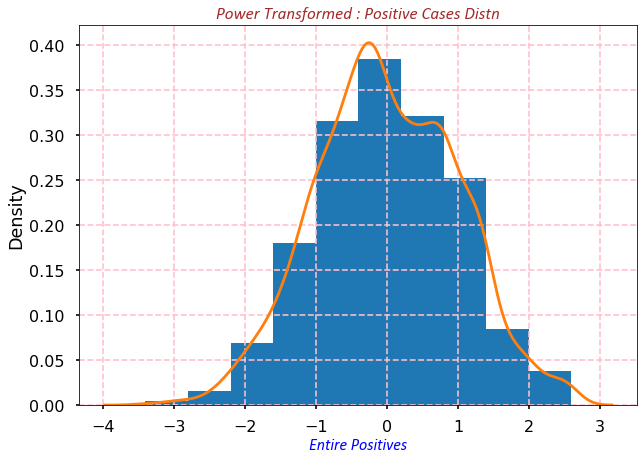

In [71]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,7))
    plt.hist(all_states_pt_pos['positive_pt'] ,density=True)
    sns.kdeplot(data=all_states_pt_pos['positive_pt'],bw_method='scott',bw_adjust=1)
    ## `bw_method` should be 'scott', 'silverman', a scalar or a callable
    ## increasing `bw_adjust` will make the curve smoother
    plt.title("Power Transformed : Positive Cases Distn",fontdict=font_dicts(kind='title'))
    plt.grid(which='major',linestyle='--',color='pink')
    plt.xlabel("Entire Positives",fontdict=font_dicts(kind='xlabel'))

##### **Here, it is not a perfect Gaussian or Normal Bell Curve and despite having some deviations on both the tails, overall we can say that it is a normal distribution.**

In [72]:
scipy.stats.skew(all_states_pt_pos['positive_pt'],bias=False)

-0.003036158234518849

In [73]:
scipy.stats.skewtest(all_states_pt_pos['positive_pt'])

SkewtestResult(statistic=-0.07827477685213896, pvalue=0.9376094810463458)

##### **No such skewness in the power transformed 'Positive'**

In [74]:
scipy.stats.kurtosis(all_states_pt_pos['positive_pt'],bias=False)

-0.23000557248373132

In [75]:
scipy.stats.kurtosistest(all_states_pt_pos['positive_pt'])

KurtosistestResult(statistic=-3.3224770370815593, pvalue=0.0008922201469807335)

##### **We have negative kurtosis that means the tails are lighter than the normal distribution. But, the degree of lightness is not super high as kurtosis is -0.23.**

##### **Let's Run some ``Normality Tests`` on the entire Power Transformed 'Positive' feature**

##### **Shapiro-Wilk Test**

In [76]:
all_states_pt_pos['positive_pt'].shape

(3976,)

In [77]:
scipy.stats.shapiro(all_states_pt_pos['positive_pt'])

ShapiroResult(statistic=0.9976674318313599, pvalue=9.815064004214946e-06)

##### **The number of records are 4000 therefore, we can run Shapiro-Wilk test because it works pretty well with the record size less than 5K. And, the p-value is highly significant that suggests that it doesn't follow the normal distribution.**

##### **Anderson-Darling Test**

In [78]:
scipy.stats.anderson(all_states_pt_pos['positive_pt'])

AndersonResult(statistic=2.652252075263732, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

##### **Anderson-Darling test is the much improved version of KS test and it eliminates the major limitation of sensitivity near the center of the distribution than at the tails. Here, we are 99% confident that it doesn't belongs to a normal distribution.**

##### **D-Agostino Test**

In [79]:
scipy.stats.normaltest(all_states_pt_pos['positive_pt'])

NormaltestResult(statistic=11.04498060262551, pvalue=0.003995884584731554)

##### **Anderson-Darling and Agostino both are powerful normality tests and gives us the highly significant results.** 

##### **QQ Plot**

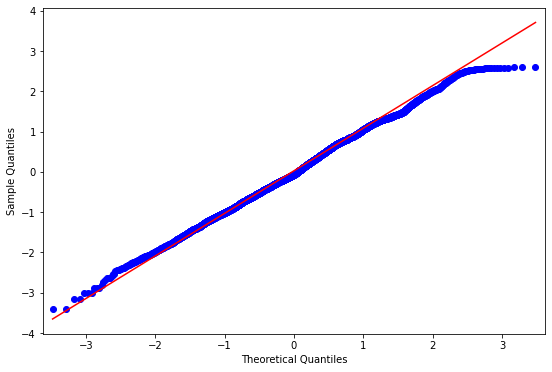

In [80]:
with plt.style.context('seaborn-bright'):
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(9,6))
    stm.graphics.gofplots.qqplot(all_states_pt_pos['positive_pt'],ax=ax,line='q')

### **Majority of the points are following the straight line with some deviations at the ends. Ideally, all the points should fall on this straight line. Therefore, we can say that it doesn't belong to a normal distribution.**

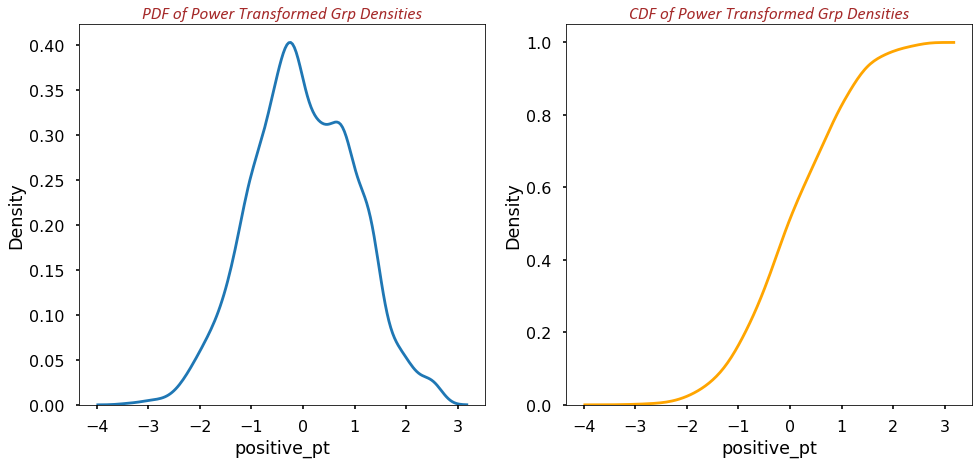

In [81]:
with plt.style.context('seaborn-poster'):
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(16,7))
    sns.kdeplot(all_states_pt_pos['positive_pt'],label='Kde',ax=ax[0],bw_method='scott',bw_adjust=1)
    ax[0].set_title('PDF of Power Transformed Grp Densities',fontdict=font_dicts(kind='title'))
    sns.kdeplot(all_states_pt_pos['positive_pt'],cumulative=True,bw_method='scott',bw_adjust=1,label='Cdf',color='orange',ax=ax[1])
    ax[1].set_title('CDF of Power Transformed Grp Densities',fontdict=font_dicts(kind='title'))
    plt.show()

### **Although Normality tests have given us highly statistically significant results but graphically(QQ, KDE and CDF plots) speaking it is not be a perfect gaussian like distribution but a slight non-normal data can be put in the bucket of normal distributions.**
- **Because nothing can be completely normal and when the data or observations increases normaliity tests gives everything as significant means non-normal.** 
- **Majority of the time Scientists also consider slightly non-normal data as normal.**

- **we can move away from Normality assumption either using Resampling/bootstrapping or non-parametric tests.**

#### **Reference Links**

https://stats.stackexchange.com/questions/284033/qq-plot-looks-normal-but-shapiro-wilk-test-says-otherwise

https://stats.stackexchange.com/questions/2492/is-normality-testing-essentially-useless

https://stats.stackexchange.com/questions/99621/should-the-shapiro-wilk-test-and-qq-plot-always-be-combined/99622#99622

##### **Lillifers Test**

In [82]:
np.round(np.mean(all_states_pt_pos['positive_pt']),3), np.round(np.std(all_states_pt_pos['positive_pt']),3)

(-0.0, 1.0)

In [83]:
## It is a Kolmogorov-Smirnov Test with estimated parameters 
## That means we can use this test even when we don't know the mean and stddev of the distribution
## It will estimate the parameters from the sample
## Both lillifers and KS Test performs the test statistics calculation using the same formula, this gets confirmed by seeing 
## the test statistics of both the tests as it is same
lilliefors(all_states_pt_pos['positive_pt'],dist='norm',pvalmethod='table')

(0.025661731372888796, 0.0009999999999998899)

##### **Kolmogorov Smirnov Test**

In [84]:
np.round(np.mean(all_states_pt_pos['positive_pt']),3), np.round(np.std(all_states_pt_pos['positive_pt']),3)

(-0.0, 1.0)

In [85]:
scipy.stats.kstest(all_states_pt_pos['positive_pt'],cdf='norm',mode='auto')

KstestResult(statistic=0.025663976892299267, pvalue=0.010441759115162142)

##### **Both Lillifers and KS tests have suggested that distribution is not like a gaussian distribution.**

##### **Majority of the tests have suggested that it's not following a normal distribution.**

##### **Will also conduct tests related to ANOVA assumptions, model residuals, homogenity(equal variances among the groups).**

##### **Let's first perform the ANOVA test for verifying the difference in means then perform the Non-parametric Kruskal-Wallis test.**

#### **``Running One-Way ANOVA``**

\begin{align}
H_{0} : \mu_{1} = \mu_{2} = \mu_{3} = \mu_{4} = \mu_{5}
\\
H_{A} : \mu_{1} != \mu_{2} != \mu_{3} != \mu_{4} != \mu_{5}
\end{align}

In [86]:
scipy.stats.f_oneway(pt_dense_grp1['pos_pt_dense1'],
                     pt_dense_grp2['pos_pt_dense2'],
                     pt_dense_grp3['pos_pt_dense3'],
                     pt_dense_grp4['pos_pt_dense4'],
                     pt_dense_grp5['pos_pt_dense5'])

F_onewayResult(statistic=137.43244292966435, pvalue=3.834952237442604e-110)

#### **As, we know that ANOVA performs F-test under the hood thus by just performing the F test 1-Way we can compute the test statistic and p-value.**
- **Here, p-value is highly significant which means groups have different means.**

In [87]:
grp_pos_cases = pd.DataFrame({'Dense1':pt_dense_grp1['pos_pt_dense1'],
                              'Dense2':pt_dense_grp2['pos_pt_dense2'],
                              'Dense3':pt_dense_grp3['pos_pt_dense3'],
                              'Dense4':pt_dense_grp4['pos_pt_dense4'],
                              'Dense5':pt_dense_grp5['pos_pt_dense5']})

In [88]:
grp_pos_cases

,Dense1,Dense2,Dense3,Dense4,Dense5
0,-2.434070,NaN,NaN,NaN,NaN
1,-2.135350,NaN,NaN,NaN,NaN
2,-2.059129,NaN,NaN,NaN,NaN
3,-2.036642,NaN,NaN,NaN,NaN
4,-2.005114,NaN,NaN,NaN,NaN
...,...,...,...,...,...
3971,NaN,NaN,NaN,1.376988,NaN
3972,NaN,NaN,NaN,1.388798,NaN
3973,NaN,NaN,NaN,1.400664,NaN
3974,NaN,NaN,NaN,1.434825,NaN


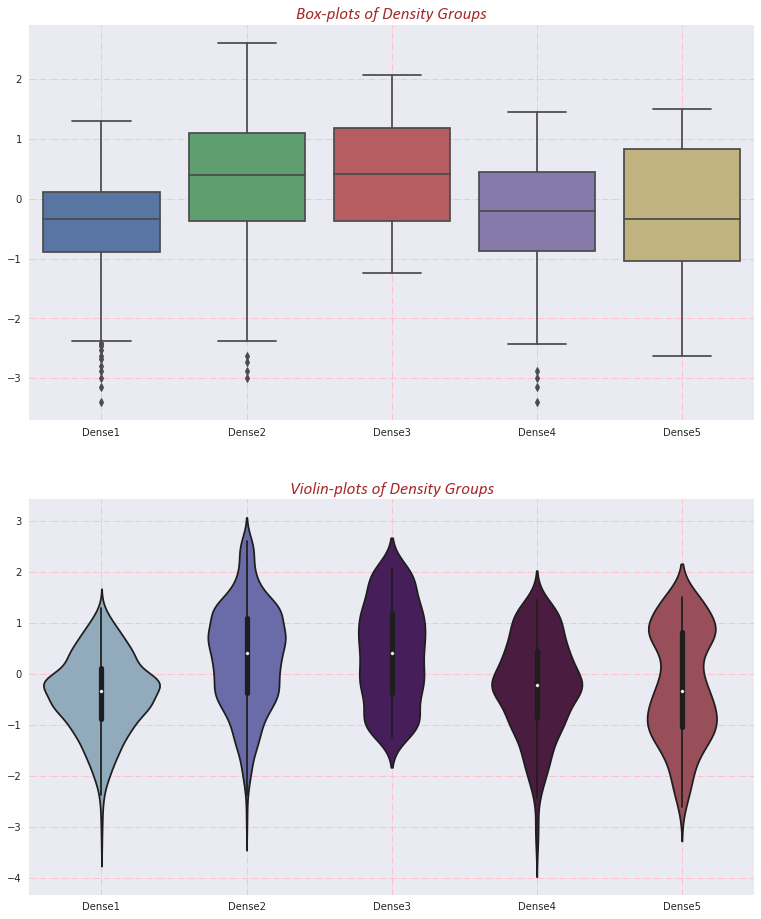

In [89]:
with plt.style.context('seaborn'):
    fig, ax = plt.subplots(nrows=2,ncols=1,figsize=(13,16))
    sns.boxplot(data=grp_pos_cases,ax=ax[0])
    ax[0].set_title("Box-plots of Density Groups",fontdict=font_dicts(kind='title'))
    ax[0].grid(which='major',color='pink',linestyle='-.')
    sns.violinplot(data=grp_pos_cases,ax=ax[1],palette=sns.color_palette('twilight'))
    ax[1].set_title("Violin-plots of Density Groups",fontdict=font_dicts(kind='title'))
    ax[1].grid(which='major',color='pink',linestyle='-.')

#### **`Group2` and `Group3` are closer to each other. And, `Group1`, `Group4` and `Group5` are closer to each other.**

In [90]:
# Prepared the data in the format such that Model can be built
grp_pos_cases_melt = pd.melt(frame=grp_pos_cases.reset_index(),id_vars='index',
                             value_vars=grp_pos_cases.columns,var_name='Dense_Grps',value_name='Positive')\
.dropna().reset_index(drop=True).drop(columns=['index'],axis=1).reset_index()

grp_pos_cases_melt.head(10)

,index,Dense_Grps,Positive
0,0,Dense1,-2.434070
1,1,Dense1,-2.135350
2,2,Dense1,-2.059129
3,3,Dense1,-2.036642
4,4,Dense1,-2.005114
5,5,Dense1,-1.975884
6,6,Dense1,-1.948639
7,7,Dense1,-1.939953
8,8,Dense1,-1.923123
9,9,Dense1,-1.914965


In [91]:
# Create the Ordinary Least Squares model
dense_grp_model = ols('Positive ~ C(Dense_Grps)',data=grp_pos_cases_melt).fit()

In [92]:
# Generating ANOVA table
dense_grp_model_anova_table = anova_lm(dense_grp_model,robust='hc3',typ='I')
dense_grp_model_anova_table

,df,sum_sq,mean_sq,F,PR(>F)
C(Dense_Grps),4.0,483.489543,120.872386,137.432443,3.834952e-110
Residual,3971.0,3492.510457,0.879504,NaN,NaN


In [93]:
dense_grps_f = scipy.stats.f(dense_grp_model_anova_table['df'][0],dense_grp_model_anova_table['df'][1])
dense_grp_model_anova_table['alpha'] = [0.05,None]
dense_grp_model_anova_table['F_crit'] = [dense_grps_f.ppf(0.95),None]
dense_grp_model_anova_table

,df,sum_sq,mean_sq,F,PR(>F),alpha,F_crit
C(Dense_Grps),4.0,483.489543,120.872386,137.432443,3.834952e-110,0.05,2.37417
Residual,3971.0,3492.510457,0.879504,NaN,NaN,NaN,NaN


#### **So, here it becomes quite evident that Null Hypothesis has been rejected by a great margin as there is a huge difference in the Critical value and Test Statistic. And, p-value is highly significant, thus, we can say that means of the groups varying alot.**

In [94]:
dense_grp_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Positive   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.121
Method:                 Least Squares   F-statistic:                     137.4
Date:                Mon, 26 Apr 2021   Prob (F-statistic):          3.83e-110
Time:                        16:38:19   Log-Likelihood:                -5383.9
No. Observations:                3976   AIC:                         1.078e+04
Df Residuals:                    3971   BIC:                         1.081e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -0.4036      0.026    -15.373      0.000      -0.455      -0.352
C(Dense_Grps)[T.Dense2]     0.7416      0.035     21.096      0.000       0.673       0.811
C(Dense_Grps)[T.Dense3]     0.8035      0.057     14.088      0.000       0.692       0.915
C(Dense_Grps)[T.Dense4]     0.1729      0.056      3.103      0.002       0.064       0.282
C(Dense_Grps)[T.Dense5]     0.1897      0.055      3.476      0.001       0.083       0.297
==============================================================================
Omnibus:                       40.304   Durbin-Watson:                   0.094
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.461
Skew:                          -0.199   Prob(JB):                     7.34e-09
Kurtosis:                       2.741   Cond. No.                         5.40
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [95]:
dense_grp_resid = dense_grp_model.resid

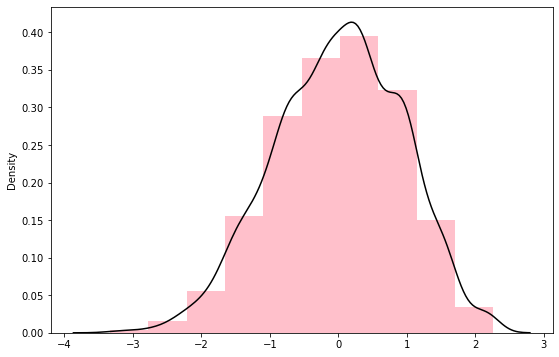

In [96]:
with plt.style.context('seaborn-bright'):
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(9,6))
    plt.hist(dense_grp_resid,density=True,color='pink')
    sns.kdeplot(dense_grp_resid,ax=ax,color='black')

#### **The first gave me a feeling of normal like distribution which has a non-smooth curve with some skewness on the left tail.**

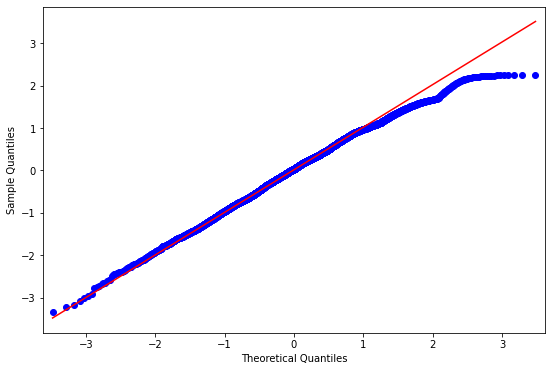

In [97]:
with plt.style.context('seaborn-bright'):
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(9,6))
    stm.graphics.gofplots.qqplot(dense_grp_resid,ax=ax,line='q')

#### **Deviations are quite evident at the upper end of the curve. So, we cannot say that the residuals are normal.**

##### **Post-Hoc Tukey's HSD Test**

In [98]:
# It performs the pair wise comparison and uses q-distribution
post_hoc_results = tukeyhsd(grp_pos_cases_melt['Positive'],groups=grp_pos_cases_melt['Dense_Grps'])

In [99]:
post_hoc_results.summary()

group1,group2,meandiff,p-adj,lower,upper,reject
Dense1,Dense2,0.7416,0.001,0.6457,0.8376,True
Dense1,Dense3,0.8035,0.001,0.6479,0.9592,True
Dense1,Dense4,0.1729,0.0165,0.0208,0.325,True
Dense1,Dense5,0.1897,0.0047,0.0408,0.3387,True
Dense2,Dense3,0.0619,0.7752,-0.0903,0.2141,False
Dense2,Dense4,-0.5687,0.001,-0.7172,-0.4202,True
Dense2,Dense5,-0.5519,0.001,-0.6972,-0.4065,True
Dense3,Dense4,-0.6306,0.001,-0.8232,-0.438,True
Dense3,Dense5,-0.6138,0.001,-0.8039,-0.4237,True
Dense4,Dense5,0.0168,0.9,-0.1704,0.204,False


c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\statsmodels\sandbox\stats\multicomp.py:775: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(np.insert(self.groupsunique.astype(str), 0, ''))


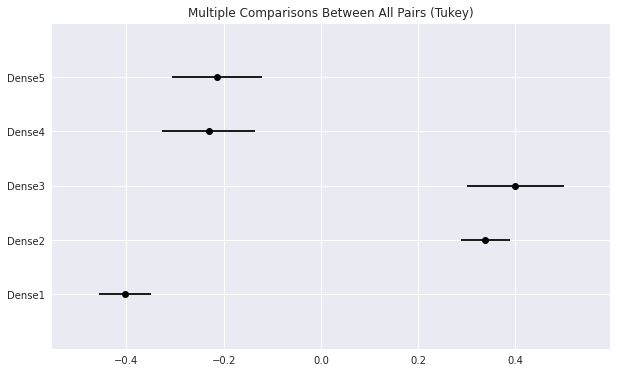

In [100]:
with plt.style.context('seaborn'):
    post_hoc_results.plot_simultaneous()

In [101]:
dense_grps_grand_mean = np.mean(grp_pos_cases.describe().loc['mean'])

In [102]:
def marginal_row_mean_plot(df,grand_mean,row1=False,row2=False,row3=False,row4=False,row5=False,row6=False):
    """
    Description: This function is created for plotting the marginal mean graph of a dataset having at most 6 groups or columns.
    
    Input parameter:
        1. df : DataFrame having treatment or group data
        2. grand_mean : Overall mean of groups or str
        3. row1 : Row or Block 1 or str
        4. row2 : Row or Block 2 or str
        5. row3 : Row or Block 3 or str
        6. row4 : Row or Block 4 or str
        7. row5 : Row or Block 5 or str
        8. row6 : Row or Block 6 or str
    
    Output: Generate the Marginal Mean Graph
    
    Work-in-progress :: These two marginal mean plot functions to be combined in one as a generic function.
    """
    plt.figure(figsize=(10,7))
    with plt.style.context("seaborn"):
        plt.axhline(grand_mean,linestyle='--',color='black',label='Grand Mean')
        if row1 != False:
            plt.plot(df[row1][0],marker='>',ls='',ms=12,color='pink',label='Row/Block 1 mean')
        if row2 != False:
            plt.plot(df[row2][1],marker='>',ls='',ms=12,color='gray',label='Row/Block 2 mean')
        if row3 != False:
            plt.plot(df[row3][2],marker='>',ls='',ms=12,color='yellow',label='Row/Block 3 mean')
        if row4 != False:
            plt.plot(df[row4][3],marker='>',ls='',ms=12,color='skyblue',label='Row/Block 4 mean')
        if row5 != False:
            plt.plot(df[row5][4],marker='>',ls='',ms=12,color='lightgray',label='Row/Block 5 mean')
        if row6 != False:
            plt.plot(df[row6][5],marker='>',ls='',ms=12,color='orange',label='Row/Block 6 mean')
        plt.xticks(rotation=25)
        plt.title('Marginal Mean Graph of Blocks or Rows',fontdict={'size':20, 'family':'calibri', 'color':'coral', 'style': 'italic'})
    plt.legend()
    return None

def marginal_mean_plot(df,grand_mean,grp1,grp2,grp3=False,grp4=False,grp5=False,grp6=False,
                       row_graph_flg=False,row1=False,row2=False,row3=False,row4=False,row5=False,row6=False):
    """
    Description: This function is created for plotting the marginal mean graph of a dataset having at most 6 groups/columns and blocks/rows.
    
    Input parameter:
        1. df : DataFrame having treatment or group data
        2. grand_mean : Overall mean of groups or str
        3. grp1 : Column or Treatment 1 or str
        4. grp2 : Column or Treatment 2 or str
        5. grp3 : Column or Treatment 3 or str
        6. grp4 : Column or Treatment 4 or str
        7. grp5 : Column or Treatment 5 or str
        8. grp6 : Column or Treatment 6 or str
    
    Output: Generate the Marginal Mean Graphs
    """
    plt.figure(figsize=(10,7))
    with plt.style.context("seaborn"):
        plt.axhline(grand_mean,linestyle='--',color='black',label='Grand Mean')
        plt.plot(np.mean(df[~df[grp1].isna()][grp1]),marker='*',ls='',ms=12,color='red',label='Grp({}) mean'.format(grp1))
        plt.plot(np.mean(df[~df[grp2].isna()][grp2]),marker='*',ls='',ms=12,color='green',label='Grp({}) mean'.format(grp2))
        if grp3 != False:
            plt.plot(np.mean(df[~df[grp3].isna()][grp3]),marker='*',ls='',ms=12,color='blue',label='Grp({}) mean'.format(grp3))
        if grp4 != False:
            plt.plot(np.mean(df[~df[grp4].isna()][grp4]),marker='*',ls='',ms=12,color='brown',label='Grp({}) mean'.format(grp4))
        if grp5 != False:
            plt.plot(np.mean(df[~df[grp5].isna()][grp5]),marker='*',ls='',ms=12,color='purple',label='Grp({}) mean'.format(grp5))
        if grp6 != False:
            plt.plot(np.mean(df[~df[grp6].isna()][grp6]),marker='*',ls='',ms=12,color='coral',label='Grp({}) mean'.format(grp6))
        plt.xticks(rotation=25)
        plt.title('Marginal Mean Graph',fontdict={'size':22, 'family':'calibri', 'color':'coral', 'style': 'italic'})
    plt.legend()
    
    if row_graph_flg!=False:
        marginal_row_mean_plot(df=df,grand_mean=grand_mean,row1=row1,row2=row2,row3=row3,row4=row4,row5=row5,row6=row6)
    return None

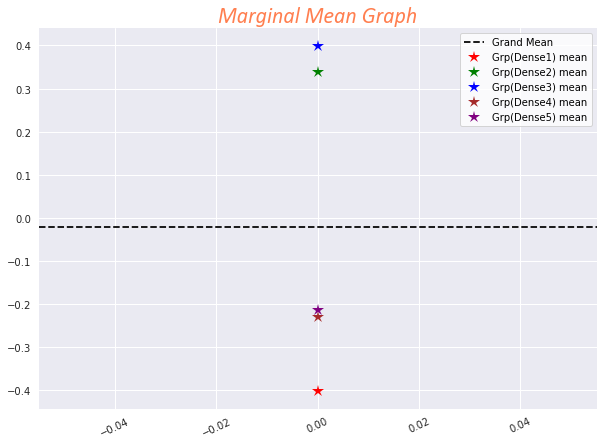

In [103]:
marginal_mean_plot(grp_pos_cases,dense_grps_grand_mean,
                   grp1='Dense1',
                   grp2='Dense2',
                   grp3='Dense3',
                   grp4='Dense4',
                   grp5='Dense5')

##### **Here, its also been proved that Grp4 and Grp5 have closer means.**

##### **Normlity Tests on Model Residuals**

In [104]:
scipy.stats.anderson(dense_grp_resid)

AndersonResult(statistic=3.9950042327282063, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [105]:
scipy.stats.normaltest(dense_grp_resid)

NormaltestResult(statistic=40.30410635651301, pvalue=1.7704126565201233e-09)

In [106]:
lilliefors(dense_grp_resid)

(0.02237560488258883, 0.0009999999999998899)

In [107]:
scipy.stats.kstest(dense_grp_resid,cdf='norm')

KstestResult(statistic=0.025651036031644425, pvalue=0.01049714753962541)

##### **So, clearly the residuals are non-normal.**

##### **Homogenity Tests**

In [108]:
scipy.stats.bartlett(grp_pos_cases[~grp_pos_cases['Dense1'].isna()]['Dense1'],
                     grp_pos_cases[~grp_pos_cases['Dense2'].isna()]['Dense2'],
                     grp_pos_cases[~grp_pos_cases['Dense3'].isna()]['Dense3'],
                     grp_pos_cases[~grp_pos_cases['Dense4'].isna()]['Dense4'],
                     grp_pos_cases[~grp_pos_cases['Dense5'].isna()]['Dense5'])

BartlettResult(statistic=130.2137139048428, pvalue=3.505078917545573e-27)

##### **Parametric Levene Test**

In [109]:
scipy.stats.levene(grp_pos_cases[~grp_pos_cases['Dense1'].isna()]['Dense1'],
                     grp_pos_cases[~grp_pos_cases['Dense2'].isna()]['Dense2'],
                     grp_pos_cases[~grp_pos_cases['Dense3'].isna()]['Dense3'],
                     grp_pos_cases[~grp_pos_cases['Dense4'].isna()]['Dense4'],
                     grp_pos_cases[~grp_pos_cases['Dense5'].isna()]['Dense5'],center='mean')

LeveneResult(statistic=43.88995730432964, pvalue=4.2273834535615835e-36)

##### **All the above tests concludes that Density Groups have a significant role in the variantion of number of cases reported in the states.**

##### **Now, there is one important point that in the earlier plotting we found that our data doesn't belongs to a normal distribution which is one of the ANOVA assumptions. And, the variances of data are also not equal across the groups. Therefore, we will conduct the Non-parametric tests.**

##### **Non-parametric replacement of ANOVA is ``Kruskal-Wallis`` Test**

In [110]:
scipy.stats.kruskal(pt_dense_grp1['pos_pt_dense1'],
                     pt_dense_grp2['pos_pt_dense2'],
                     pt_dense_grp3['pos_pt_dense3'],
                     pt_dense_grp4['pos_pt_dense4'],
                     pt_dense_grp5['pos_pt_dense5'])

KruskalResult(statistic=465.62372045417294, pvalue=1.819534601931187e-99)

##### **Post-Hoc -- MannWhitney Test with no correction of alpha**

In [111]:
pd.DataFrame(post_hocs.posthoc_mannwhitney(grp_pos_cases_melt[['Dense_Grps','Positive']],
                                                 val_col='Positive',
                                                 group_col='Dense_Grps')).applymap(lambda val: np.round(val,5))

,Dense1,Dense2,Dense3,Dense4,Dense5
Dense1,1.00000,0.00000,0.00000,0.00027,0.00360
Dense2,0.00000,1.00000,0.43591,0.00000,0.00000
Dense3,0.00000,0.43591,1.00000,0.00000,0.00000
Dense4,0.00027,0.00000,0.00000,1.00000,0.99716
Dense5,0.00360,0.00000,0.00000,0.99716,1.00000


##### **Quite similar results here too, Grp4 and Grp5 tends to have some similarities. But, `Group2` and `Group3` are not so similar as per the MannWhitney Test.**
- **Now, to get more precise results I would use ``Sidak`` correction for alpha as it is a very powerful concept and personally like this concept.**
##### **NOTE: We can also use Bonferroni Correction but it might be not so accurate some times.**

##### **Post-Hoc -- MannWhitney Test with Sidak correction of alpha**

In [112]:
pd.DataFrame(post_hocs.posthoc_mannwhitney(grp_pos_cases_melt[['Dense_Grps','Positive']],
                                                 val_col='Positive',
                                                 group_col='Dense_Grps',
                                                 p_adjust='sidak')).applymap(lambda val: np.round(val,5))

,Dense1,Dense2,Dense3,Dense4,Dense5
Dense1,1.00000,0.00000,0.00000,0.00274,0.03543
Dense2,0.00000,1.00000,0.99674,0.00000,0.00000
Dense3,0.00000,0.99674,1.00000,0.00000,0.00000
Dense4,0.00274,0.00000,0.00000,1.00000,1.00000
Dense5,0.03543,0.00000,0.00000,1.00000,1.00000


##### **`Group4` and `Group5` tends to have some similarities. And, `Group2` and `Group3` are also marked as  similar as per the MannWhitney Test with Sidak Correction.**

##### **Post-Hoc -- MannWhitney Test with Bonferroni correction of alpha**

In [113]:
pd.DataFrame(post_hocs.posthoc_mannwhitney(grp_pos_cases_melt[['Dense_Grps','Positive']],
                                                 val_col='Positive',
                                                 group_col='Dense_Grps',
                                                 p_adjust='bonferroni')).applymap(lambda val: np.round(val,5))

,Dense1,Dense2,Dense3,Dense4,Dense5
Dense1,1.00000,0.0,0.0,0.00274,0.036
Dense2,0.00000,1.0,1.0,0.00000,0.000
Dense3,0.00000,1.0,1.0,0.00000,0.000
Dense4,0.00274,0.0,0.0,1.00000,1.000
Dense5,0.03600,0.0,0.0,1.00000,1.000


##### **Results are similar to Sidak Correction.**

##### **Non-Parametric Levene Test**

In [114]:
# Levene test is performed for checking the equality of variances. And, a replacement of Bartlett's Test.
scipy.stats.levene(grp_pos_cases[~grp_pos_cases['Dense1'].isna()]['Dense1'],
                     grp_pos_cases[~grp_pos_cases['Dense2'].isna()]['Dense2'],
                     grp_pos_cases[~grp_pos_cases['Dense3'].isna()]['Dense3'],
                     grp_pos_cases[~grp_pos_cases['Dense4'].isna()]['Dense4'],
                     grp_pos_cases[~grp_pos_cases['Dense5'].isna()]['Dense5'],center='median')

LeveneResult(statistic=42.883650220306166, pvalue=2.844472046993574e-35)

## **``Two Factor ANOVA``**

## **`CASE_STUDY:2`**

#### **Case study prepared by: Emily Zitek**

#### **Overview**
- People have different ways of improving their mood when angry. We have all seen people punch a wall when mad, and indeed, previous research has indicated that some people aggress to improve their mood (Bushman, Baumeister & Phillips, 2001). What do the top athletes do when angry? Striegel (1994) found that anger often hurts an athlete’s performance and that capability to control anger is what makes good athletes even better. This study adds to the past research and examines the difference in ways to improve an angry mood by gender and sports participation.
- The participants were 78 Rice University undergraduates, ages 17 to 23. Of these 78 participants, 48 were females and 30 were males and 25 were athletes and 53 were non-athletes. People who did not play a varsity or club sport were considered non-athletes. The 13 contact sport athletes played soccer, football, rugby, or basketball, and the 12 non-contact sport athletes participated in Ultimate Frisbee, baseball, tennis, swimming, volleyball, crew, or dance.
- The participants were asked to respond to a questionnaire that asked about what they do to improve their mood when angry or furious. Then they filled out a demographics questionnaire.

- Note: This study used the most recent version of the State-Trait Anger Expression Inventory (STAXI-2) (Spielberger, Sydeman, Owen & Marsh, 1999) which was modified to create an Angry Mood Improvement Inventory similar to that created by Bushman et al. (2001).

#### **Questions to Answer**
- Do athletes and non-athletes deal with anger in the same way? Are there any gender differences? Specifically, are men more likely to believe that aggressive behavior can improve an angry mood?

#### **Descriptions of Variables**
![img1](Datasets\Anger_mood_variables.png)

In [115]:
anger_mood = pd.read_excel('Datasets/angry_moods.xls')

In [116]:
anger_mood.head()

,Gender,Sports,Anger-Out,Anger-In,Control-Out,Control-In,Anger_Expression
0,2,1,18,13,23,20,36
1,2,1,14,17,25,24,30
2,2,1,13,14,28,28,19
3,2,1,17,24,23,23,43
4,1,1,16,17,26,28,27


In [117]:
anger_mood.describe()

,Gender,Sports,Anger-Out,Anger-In,Control-Out,Control-In,Anger_Expression
count,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000
mean,1.615385,1.679487,16.076923,18.576923,23.692308,21.961538,37.000000
std,0.489653,0.469694,4.217370,4.697386,4.688498,4.945002,12.941426
min,1.000000,1.000000,9.000000,10.000000,14.000000,11.000000,7.000000
25%,1.000000,1.000000,13.000000,15.000000,21.000000,18.250000,27.000000
50%,2.000000,2.000000,16.000000,18.500000,24.000000,22.000000,36.000000
75%,2.000000,2.000000,18.000000,22.000000,27.000000,24.750000,44.750000
max,2.000000,2.000000,27.000000,31.000000,32.000000,32.000000,68.000000


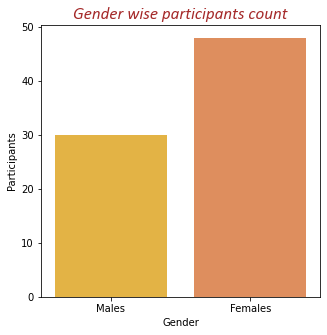

In [118]:
with plt.style.context('seaborn-bright'):
    plt.figure(figsize=(5,5))
    sns.barplot(data=anger_mood['Gender'].value_counts().reset_index().rename(columns={'index':'Gender','Gender':'Participants'}),
                x='Gender',y='Participants',palette=sns.color_palette('plasma_r'))
    plt.xticks([0,1],['Males','Females'])
    plt.title('Gender wise participants count',fontdict=font_dicts(kind='title'))

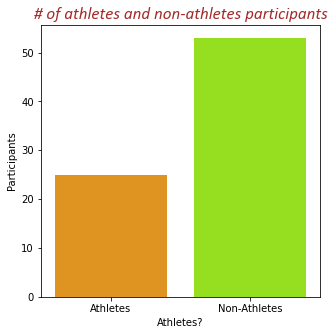

In [119]:
with plt.style.context('seaborn-bright'):
    plt.figure(figsize=(5,5))
    sns.barplot(data=anger_mood['Sports'].value_counts().reset_index().rename(columns={'index':'Athletes?','Sports':'Participants'}),
                x='Athletes?',y='Participants',palette=sns.color_palette('gist_rainbow'))
    plt.xticks([0,1],['Athletes','Non-Athletes'])
    plt.title('# of athletes and non-athletes participants',fontdict=font_dicts(kind='title'))

In [120]:
def feat_pt_ss(frame,col):
    """
    Description: This function is created for performing the Power Transformation and Standard Scaling on the features of the dataset.
    
    Input: It accepts below input parameters:
        1. frame: pandas DataFrame
                Dataset containing features
        2. col: str
                Features which you want to transform
    
    Return: None
        It creates the transformed features in the dataset.
    """
    col_pt_name = str(col)+'_pt'
    col_pt_ss_name = str(col)+'_pt_ss'
    frame[col_pt_name] = scipy.stats.boxcox(frame[col])[0]
    frame[col_pt_ss_name] = ss.fit_transform(frame[[col_pt_name]])

In [121]:
df_cols = ['Anger-Out','Anger-In','Control-Out','Control-In','Anger_Expression']
for feat in df_cols:
    feat_pt_ss(anger_mood,feat)

In [122]:
anger_mood.head()

,Gender,Sports,Anger-Out,Anger-In,Control-Out,Control-In,Anger_Expression,Anger-Out_pt,Anger-Out_pt_ss,Anger-In_pt,Anger-In_pt_ss,Control-Out_pt,Control-Out_pt_ss,Control-In_pt,Control-In_pt_ss,Anger_Expression_pt,Anger_Expression_pt_ss
0,2,1,18,13,23,20,36,2.938922,0.564209,4.516347,-1.240888,47.728275,-0.182358,13.499843,-0.382374,19.693945,-0.037114
1,2,1,14,17,25,24,30,2.679492,-0.406073,5.319725,-0.269975,53.406850,0.252661,15.925653,0.428930,16.913629,-0.510827
2,2,1,13,14,28,28,19,2.603134,-0.691656,4.729601,-0.983162,62.205965,0.926737,18.286565,1.218528,11.460573,-1.439924
3,2,1,17,24,23,23,43,2.879852,0.343284,6.489748,1.144042,47.728275,-0.182358,15.325789,0.228307,22.811737,0.494099
4,1,1,16,17,26,28,27,2.817242,0.109120,5.319725,-0.269975,56.303373,0.474556,18.286565,1.218528,15.478238,-0.755390


#### **Visualizing the features distribution post transformation and scaling**

c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either 

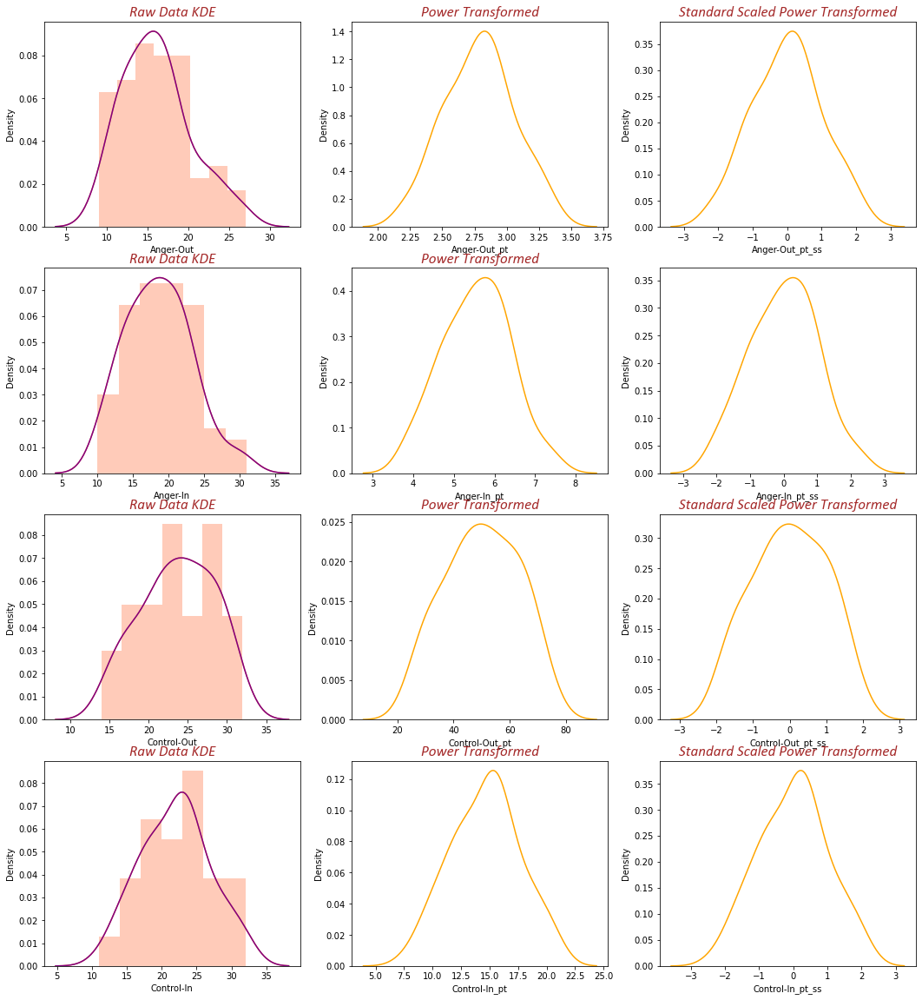

In [123]:
## Here, I'm plotting all the 3 versions of the distributions
# Raw/original data, Power-transformed data and Power-transformed + Scaled data
# Although, SS doesn't really impact the distribution of the data

with plt.style.context('seaborn-bright'):
    fig , ax = plt.subplots(nrows=4,ncols=3,figsize=(18,20))
    sns.distplot(anger_mood['Anger-Out'],ax=ax[0,0],color='coral')
    sns.kdeplot(anger_mood['Anger-Out'],ax=ax[0,0],label='Anger-Out',color='purple')
    sns.kdeplot(anger_mood['Anger-Out_pt'],ax=ax[0,1],label='PT Anger-Out',color='orange')
    sns.kdeplot(anger_mood['Anger-Out_pt_ss'],ax=ax[0,2],label='SS PT Anger-Out',color='orange')
    ax[0,0].set_title('Raw Data KDE',fontdict=font_dicts(kind='title'))
    ax[0,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    ax[0,2].set_title('Standard Scaled Power Transformed',fontdict=font_dicts(kind='title'))
    
    sns.distplot(anger_mood['Anger-In'],ax=ax[1,0],color='coral')
    sns.kdeplot(anger_mood['Anger-In'],ax=ax[1,0],label='Anger-In',color='purple')
    sns.kdeplot(anger_mood['Anger-In_pt'],ax=ax[1,1],label='PT Anger-In',color='orange')
    sns.kdeplot(anger_mood['Anger-In_pt_ss'],ax=ax[1,2],label='SS PT Anger-In',color='orange')
    ax[1,0].set_title('Raw Data KDE',fontdict=font_dicts(kind='title'))
    ax[1,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    ax[2,2].set_title('Standard Scaled Power Transformed',fontdict=font_dicts(kind='title'))
    
    sns.distplot(anger_mood['Control-Out'],ax=ax[2,0],color='coral')
    sns.kdeplot(anger_mood['Control-Out'],ax=ax[2,0],label='Control-Out',color='purple')
    sns.kdeplot(anger_mood['Control-Out_pt'],ax=ax[2,1],label='PT Control-Out',color='orange')
    sns.kdeplot(anger_mood['Control-Out_pt_ss'],ax=ax[2,2],label='SS PT Control-Out',color='orange')
    ax[2,0].set_title('Raw Data KDE',fontdict=font_dicts(kind='title'))
    ax[2,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    ax[2,2].set_title('Standard Scaled Power Transformed',fontdict=font_dicts(kind='title'))
    
    sns.distplot(anger_mood['Control-In'],ax=ax[3,0],color='coral')
    sns.kdeplot(anger_mood['Control-In'],ax=ax[3,0],label='Control-In',color='purple')
    sns.kdeplot(anger_mood['Control-In_pt'],ax=ax[3,1],label='PT Control-In',color='orange')
    sns.kdeplot(anger_mood['Control-In_pt_ss'],ax=ax[3,2],label='SS PT Control-In',color='orange')
    ax[3,0].set_title('Raw Data KDE',fontdict=font_dicts(kind='title'))
    ax[3,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    ax[3,2].set_title('Standard Scaled Power Transformed',fontdict=font_dicts(kind='title'))

- **Well, none of the original groups have clear pareto or non-normal distributions, I'm just giving a try here with power-transformation.**
- **The original data also looks like fairly normally distributed.**
- **After seeing the above KDE, its been evident that Power Transformation has introduced very slight variation in the distribution towards normality, however, the raw data distribution of features pretty much looks gaussian-like.**

#### **Visualizing QQ plots**

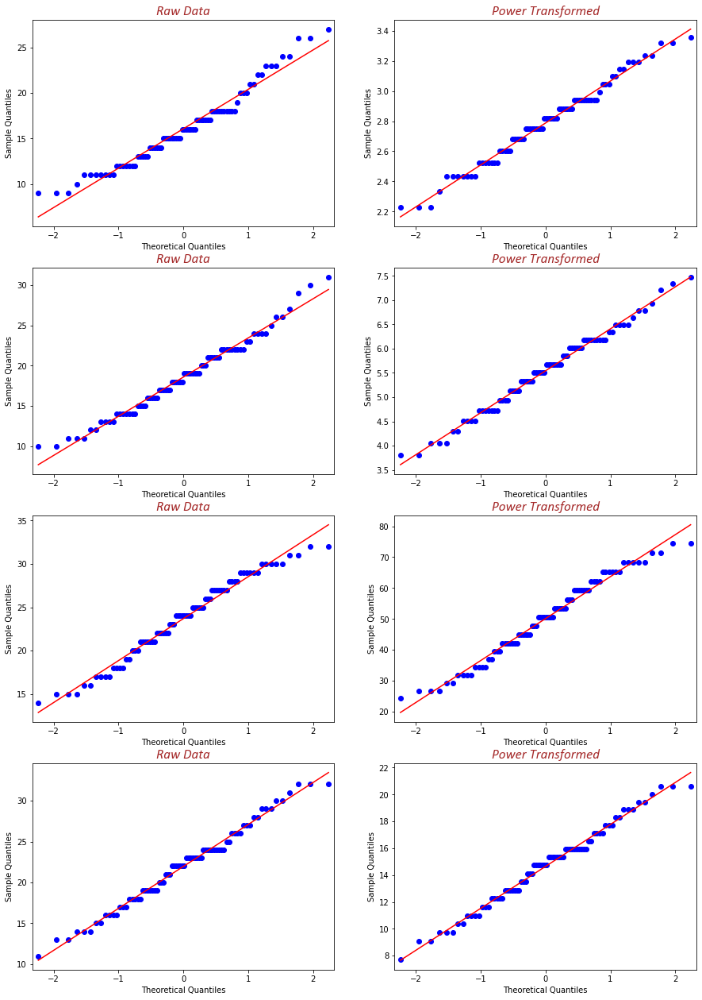

In [124]:
with plt.style.context('seaborn-bright'):
    fig , ax = plt.subplots(nrows=4,ncols=2,figsize=(15,22))
    stm.graphics.gofplots.qqplot(anger_mood['Anger-Out'],ax=ax[0,0],line='r',label='Anger-Out')
    stm.graphics.gofplots.qqplot(anger_mood['Anger-Out_pt'],ax=ax[0,1],line='r')
    ax[0,0].set_title('Raw Data',fontdict=font_dicts(kind='title'))
    ax[0,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    
    stm.graphics.gofplots.qqplot(anger_mood['Anger-In'],ax=ax[1,0],line='r')
    stm.graphics.gofplots.qqplot(anger_mood['Anger-In_pt'],ax=ax[1,1],line='r')
    ax[1,0].set_title('Raw Data',fontdict=font_dicts(kind='title'))
    ax[1,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    
    stm.graphics.gofplots.qqplot(anger_mood['Control-Out'],ax=ax[2,0],line='r')
    stm.graphics.gofplots.qqplot(anger_mood['Control-Out_pt'],ax=ax[2,1],line='r')
    ax[2,0].set_title('Raw Data',fontdict=font_dicts(kind='title'))
    ax[2,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))
    
    stm.graphics.gofplots.qqplot(anger_mood['Control-In'],ax=ax[3,0],line='r')
    stm.graphics.gofplots.qqplot(anger_mood['Control-In_pt'],ax=ax[3,1],line='r')
    ax[3,0].set_title('Raw Data',fontdict=font_dicts(kind='title'))
    ax[3,1].set_title('Power Transformed',fontdict=font_dicts(kind='title'))

### **QQ plots are also telling us the same story, power transformed does minimizes some amount of deviations and raw data can fit in the bucket of gaussian-like.**

### **Now, lets run some normality tests because we have very small dataset then these tests can help us in identifying some insights.**

#### **Normality Tests**

### **`Anger-Out`**

In [125]:
print(np.round(scipy.stats.shapiro(anger_mood['Anger-Out']),4),
      np.round(scipy.stats.normaltest(anger_mood['Anger-Out']),4),
      scipy.stats.anderson(anger_mood['Anger-Out']),
      scipy.stats.kstest(pd.DataFrame(ss.fit_transform(anger_mood[['Anger-Out']]))[0],cdf='norm'),sep='\n')

[0.9597 0.0147]
[4.4764 0.1067]
AndersonResult(statistic=0.8866161999077633, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.11801006873469855, pvalue=0.21016099597115612)


- **Other than Shapiro-wilk test all are saying raw data is normal.**

In [126]:
print(np.round(scipy.stats.shapiro(anger_mood['Anger-Out_pt']),4),
      np.round(scipy.stats.normaltest(anger_mood['Anger-Out_pt']),4),
      scipy.stats.anderson(anger_mood['Anger-Out_pt']),
      scipy.stats.kstest(anger_mood['Anger-Out_pt_ss'],cdf='norm'),sep='\n')

[0.9813 0.3063]
[0.7455 0.6888]
AndersonResult(statistic=0.42091177774017297, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.08117785751780704, pvalue=0.6527048356296961)


- **All tests are saying that power-transformed data is normal.**

### **`Anger-In`**

In [127]:
print(np.round(scipy.stats.shapiro(anger_mood['Anger-In']),4),
      np.round(scipy.stats.normaltest(anger_mood['Anger-In']),4),
      scipy.stats.anderson(anger_mood['Anger-In']),
      scipy.stats.kstest(pd.DataFrame(ss.fit_transform(anger_mood[['Anger-In']]))[0],cdf='norm'),sep='\n')

[0.9793 0.2346]
[1.6838 0.4309]
AndersonResult(statistic=0.38757509282743285, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.06738948552710411, pvalue=0.8469621917851082)


- **All tests are saying that raw data is normal.**

In [128]:
print(np.round(scipy.stats.shapiro(anger_mood['Anger-In_pt']),4),
      np.round(scipy.stats.normaltest(anger_mood['Anger-In_pt']),4),
      scipy.stats.anderson(anger_mood['Anger-In_pt']),
      scipy.stats.kstest(anger_mood['Anger-In_pt_ss'],cdf='norm'),sep='\n')

[0.9861 0.5571]
[0.5535 0.7583]
AndersonResult(statistic=0.3421858878821098, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.07561264312054072, pvalue=0.7350991362050974)


- **All tests are saying that power-transformed data is normal.**

### **`Control-Out`**

In [129]:
print(np.round(scipy.stats.shapiro(anger_mood['Control-Out']),4),
      np.round(scipy.stats.normaltest(anger_mood['Control-Out']),4),
      scipy.stats.anderson(anger_mood['Control-Out']),
      scipy.stats.kstest(pd.DataFrame(ss.fit_transform(anger_mood[['Control-Out']]))[0],cdf='norm'),sep='\n')

[0.969  0.0544]
[6.9335 0.0312]
AndersonResult(statistic=0.6212161705866492, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.0944989633727723, pvalue=0.46106545331192683)


- **All tests other than D'Agostino are saying that raw data is normal.**

In [130]:
print(np.round(scipy.stats.shapiro(anger_mood['Control-Out_pt']),4),
      np.round(scipy.stats.normaltest(anger_mood['Control-Out_pt']),4),
      scipy.stats.anderson(anger_mood['Control-Out_pt']),
      scipy.stats.kstest(anger_mood['Control-Out_pt_ss'],cdf='norm'),sep='\n')

[0.9708 0.07  ]
[7.8824 0.0194]
AndersonResult(statistic=0.5741237073639383, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.09114203775949703, pvalue=0.507088307466719)


- **All tests other than D'Agostino are saying that power-transformed data is normal.**

### **`Control-In`**

In [131]:
print(np.round(scipy.stats.shapiro(anger_mood['Control-In']),4),
      np.round(scipy.stats.normaltest(anger_mood['Control-In']),4),
      scipy.stats.anderson(anger_mood['Control-In']),
      scipy.stats.kstest(pd.DataFrame(ss.fit_transform(anger_mood[['Control-In']]))[0],cdf='norm'),sep='\n')

[0.9831 0.3885]
[1.1044 0.5757]
AndersonResult(statistic=0.37670142865145806, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.08269920968992817, pvalue=0.6299932997185698)


- **All tests are saying that raw data is normal.**

In [132]:
print(np.round(scipy.stats.shapiro(anger_mood['Control-In_pt']),4),
      np.round(scipy.stats.normaltest(anger_mood['Control-In_pt']),4),
      scipy.stats.anderson(anger_mood['Control-In_pt']),
      scipy.stats.kstest(anger_mood['Control-In_pt_ss'],cdf='norm'),sep='\n')

[0.9836 0.4157]
[1.0368 0.5955]
AndersonResult(statistic=0.37677245211017407, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.08740098100613486, pvalue=0.5605715367622379)


- **All tests are saying that power-transformed data is normal.**

### **Quite similar results here generated by various normality tests. So, will be using Raw Data for further 2-Way ANOVA.**

In [133]:
anger_mood.head()

,Gender,Sports,Anger-Out,Anger-In,Control-Out,Control-In,Anger_Expression,Anger-Out_pt,Anger-Out_pt_ss,Anger-In_pt,Anger-In_pt_ss,Control-Out_pt,Control-Out_pt_ss,Control-In_pt,Control-In_pt_ss,Anger_Expression_pt,Anger_Expression_pt_ss
0,2,1,18,13,23,20,36,2.938922,0.564209,4.516347,-1.240888,47.728275,-0.182358,13.499843,-0.382374,19.693945,-0.037114
1,2,1,14,17,25,24,30,2.679492,-0.406073,5.319725,-0.269975,53.406850,0.252661,15.925653,0.428930,16.913629,-0.510827
2,2,1,13,14,28,28,19,2.603134,-0.691656,4.729601,-0.983162,62.205965,0.926737,18.286565,1.218528,11.460573,-1.439924
3,2,1,17,24,23,23,43,2.879852,0.343284,6.489748,1.144042,47.728275,-0.182358,15.325789,0.228307,22.811737,0.494099
4,1,1,16,17,26,28,27,2.817242,0.109120,5.319725,-0.269975,56.303373,0.474556,18.286565,1.218528,15.478238,-0.755390


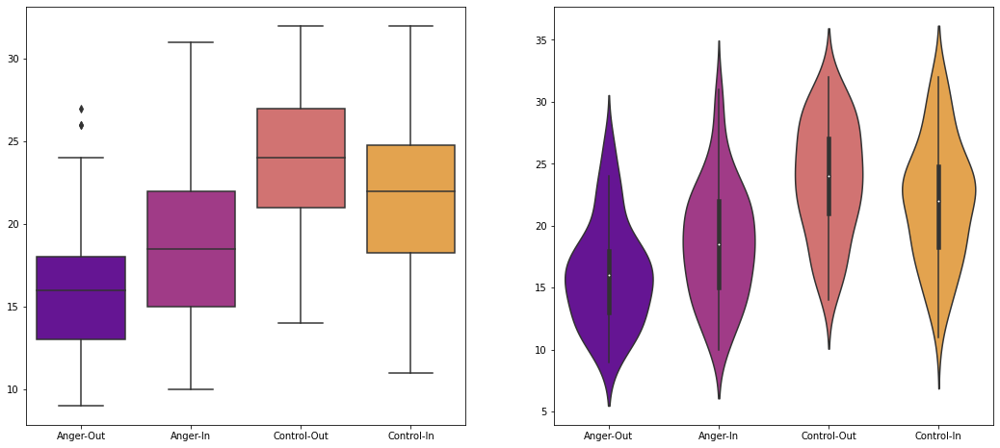

In [134]:
with plt.style.context('seaborn-bright'):
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(18,8))
    sns.boxplot(data=anger_mood[['Anger-Out','Anger-In','Control-Out','Control-In']],palette='plasma',ax=ax[0])
    sns.violinplot(data=anger_mood[['Anger-Out','Anger-In','Control-Out','Control-In']],palette='plasma',ax=ax[1])

### **Here, it is quite clear that means are not equal across the groups. And, more number of people are able to control their anger.**

In [135]:
anger_mood_melt = pd.melt(frame=anger_mood,
                          id_vars=['Gender','Sports'],
                          value_vars=['Anger-Out','Anger-In','Control-Out','Control-In'],
                          var_name='Groups',
                          value_name='Score')

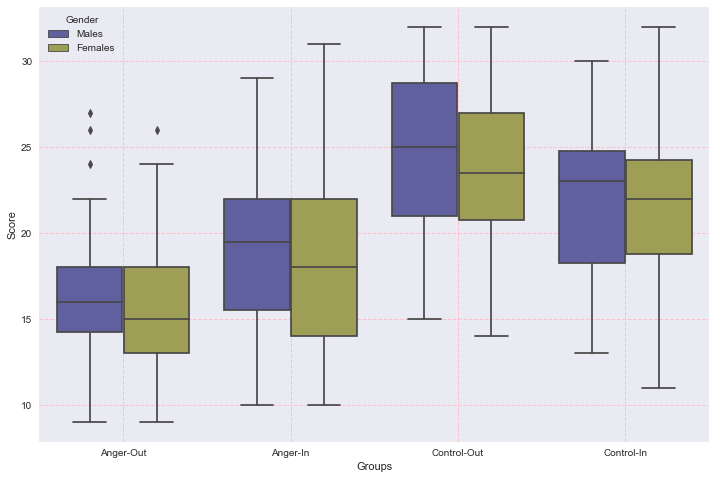

In [136]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(12,8))
    g = sns.boxplot(data=anger_mood_melt,x='Groups',y='Score',hue='Gender',palette='gist_stern')
    plt.grid(which='major',linestyle='--',color='pink')
    leg = g.axes.get_legend()
    new_title = 'Gender'
    leg.set_title(new_title)
    new_labels = ['Males', 'Females']
    for t, l in zip(leg.texts, new_labels): t.set_text(l)
    plt.show()

### **Here, on an average we can say that Males believe in expressing anger verbally or physically, however, this is also true for some females as well. The difference in both the genders is quite small when it comes to applying cooling or calming off techniques, but, womens can be very slightly better in it.**

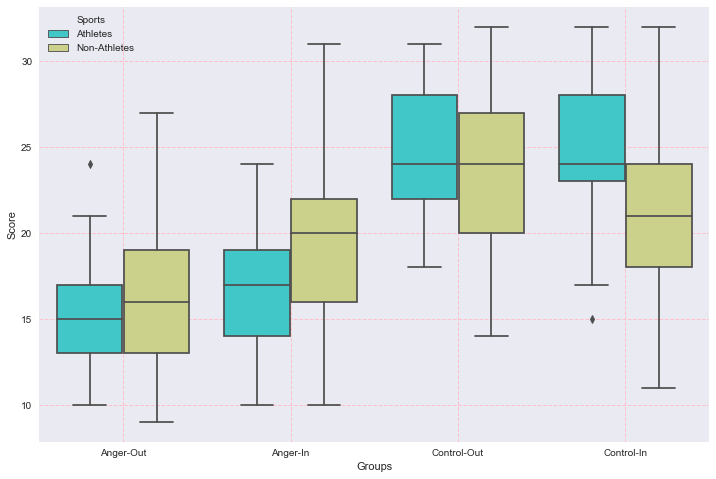

In [137]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(12,8))
    g = sns.boxplot(data=anger_mood_melt,x='Groups',y='Score',hue='Sports',palette='rainbow')
    plt.grid(which='major',linestyle='--',color='pink')
    leg = g.axes.get_legend()
    new_title = 'Sports'
    leg.set_title(new_title)
    new_labels = ['Athletes', 'Non-Athletes']
    for t, l in zip(leg.texts, new_labels): t.set_text(l)
    plt.show()

### **One thing pretty clear here that athletes are good with calming or cooling off techniques. And, same group also believe less in expressing anger verbally or physically aggressive. There is one more thing that athletes tend to experience less number of anger issues. However, few non-athletes are good in controlling the outward expression of angry feelings better than athletes.**

In [138]:
## Dataset for ANOVA
anger_mood_melt.head()

,Gender,Sports,Groups,Score
0,2,1,Anger-Out,18
1,2,1,Anger-Out,14
2,2,1,Anger-Out,13
3,2,1,Anger-Out,17
4,1,1,Anger-Out,16


In [139]:
anger_mood_model = ols('Score ~ C(Groups)+C(Gender)+C(Sports)',data=anger_mood_melt).fit()

In [140]:
anger_mood_model_annova_table = anova_lm(anger_mood_model)
anger_mood_fdist_grps = scipy.stats.f(3,306)
anger_mood_fdist_gender = scipy.stats.f(1,306)
anger_mood_fdist_sports = scipy.stats.f(1,306)
anger_mood_model_annova_table['F_Crit'] = [anger_mood_fdist_grps.ppf(0.95),
                                           anger_mood_fdist_gender.ppf(0.95),
                                           anger_mood_fdist_sports.ppf(0.95),
                                           None]

anger_mood_model_annova_table['Alpha'] = [0.05,0.05,0.05,None]
anger_mood_model_annova_table = anger_mood_model_annova_table.applymap(lambda val: np.round(val,4))
anger_mood_model_annova_table

,df,sum_sq,mean_sq,F,PR(>F),F_Crit,Alpha
C(Groups),3.0,2720.0769,906.6923,42.0026,0.0000,2.6341,0.05
C(Gender),1.0,36.2924,36.2924,1.6812,0.1957,3.8720,0.05
C(Sports),1.0,2.2860,2.2860,0.1059,0.7451,3.8720,0.05
Residual,306.0,6605.4985,21.5866,NaN,NaN,NaN,NaN


In [141]:
anger_mood_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Score   R-squared:                       0.295
Model:                            OLS   Adj. R-squared:                  0.283
Method:                 Least Squares   F-statistic:                     25.56
Date:                Mon, 26 Apr 2021   Prob (F-statistic):           1.53e-21
Time:                        16:38:40   Log-Likelihood:                -918.92
No. Observations:                 312   AIC:                             1850.
Df Residuals:                     306   BIC:                             1872.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                   19.1249      0.718     26.633      0.000      17.712      20.538
C(Groups)[T.Anger-Out]      -2.5000      0.744     -3.360      0.001      -3.964      -1.036
C(Groups)[T.Control-In]      3.3846      0.744      4.549      0.000       1.921       4.849
C(Groups)[T.Control-Out]     5.1154      0.744      6.876      0.000       3.651       6.579
C(Gender)[T.2]              -0.6872      0.542     -1.267      0.206      -1.754       0.380
C(Sports)[T.2]              -0.1840      0.565     -0.325      0.745      -1.296       0.929
==============================================================================
Omnibus:                        4.840   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.089   Jarque-Bera (JB):                3.998
Skew:                           0.182   Prob(JB):                        0.135
Kurtosis:                       2.581   Cond. No.                         6.56
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### **Post-Hoc Test**

In [142]:
import scikit_posthocs as post_hocs
from statsmodels.stats.multicomp import pairwise_tukeyhsd as tukeyhsd

In [143]:
post_hoc_tukey = tukeyhsd(endog=anger_mood_melt['Score'],groups=anger_mood_melt['Groups'])

In [144]:
post_hoc_tukey.summary()

group1,group2,meandiff,p-adj,lower,upper,reject
Anger-In,Anger-Out,-2.5,0.0048,-4.4212,-0.5788,True
Anger-In,Control-In,3.3846,0.001,1.4634,5.3058,True
Anger-In,Control-Out,5.1154,0.001,3.1942,7.0366,True
Anger-Out,Control-In,5.8846,0.001,3.9634,7.8058,True
Anger-Out,Control-Out,7.6154,0.001,5.6942,9.5366,True
Control-In,Control-Out,1.7308,0.0941,-0.1904,3.652,False


c:\users\rajsh\appdata\local\programs\python\python36\lib\site-packages\statsmodels\sandbox\stats\multicomp.py:775: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(np.insert(self.groupsunique.astype(str), 0, ''))


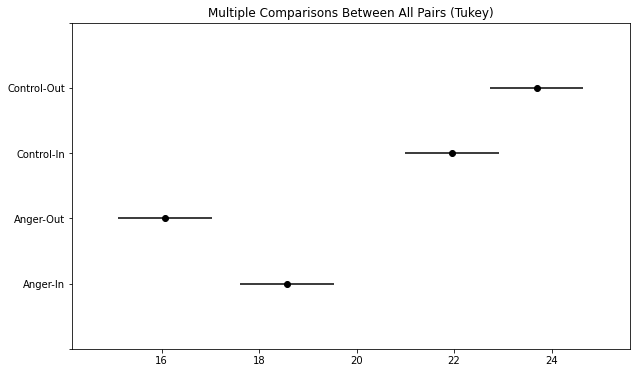

In [145]:
post_hoc_tukey.plot_simultaneous();

#### **Interaction Among variables**

In [146]:
anger_mood_model_intr_grp_gender = ols('Score ~ C(Groups)*C(Gender)',data=anger_mood_melt).fit()

In [147]:
anova_lm(anger_mood_model_intr_grp_gender).applymap(lambda val : np.round(val,4))

,df,sum_sq,mean_sq,F,PR(>F)
C(Groups),3.0,2720.0769,906.6923,41.8072,0.0000
C(Gender),1.0,36.2924,36.2924,1.6734,0.1968
C(Groups):C(Gender),3.0,14.7887,4.9296,0.2273,0.8774
Residual,304.0,6592.9958,21.6875,NaN,NaN


In [148]:
anger_mood_melt.groupby(['Gender'])['Score'].mean()

Gender
1    20.508333
2    19.807292
Name: Score, dtype: float64

In [149]:
anger_mood_melt.groupby(['Gender','Groups'])[['Score']].mean().T

Gender          1                                            2             \
Groups   Anger-In  Anger-Out Control-In Control-Out   Anger-In  Anger-Out   
Score   19.033333  16.566667  21.966667   24.466667  18.291667  15.770833   

Gender                         
Groups Control-In Control-Out  
Score   21.958333   23.208333

### **The test shows no significant interaction between Groups and Gender. Also, the means across groups is very close for both the genders. Thus, we can say that there are no gener differences.**

In [150]:
anger_mood_model_intr_grp_sports = ols('Score ~ C(Groups)*C(Sports)',data=anger_mood_melt).fit()

In [151]:
anova_lm(anger_mood_model_intr_grp_sports).applymap(lambda val : np.round(val,4))

,df,sum_sq,mean_sq,F,PR(>F)
C(Groups),3.0,2720.0769,906.6923,44.1172,0.0000
C(Sports),1.0,3.9138,3.9138,0.1904,0.6629
C(Groups):C(Sports),3.0,392.3880,130.7960,6.3642,0.0003
Residual,304.0,6247.7751,20.5519,NaN,NaN


In [152]:
anger_mood_melt.groupby(['Sports'])['Score'].mean()

Sports
1    20.24
2    20.00
Name: Score, dtype: float64

In [153]:
anger_mood_melt.groupby(['Sports','Groups'])[['Score']].mean().T

Sports        1                                           2            \
Groups Anger-In Anger-Out Control-In Control-Out   Anger-In Anger-Out   
Score     16.68     15.28      24.32       24.68  19.471698  16.45283   

Sports                         
Groups Control-In Control-Out  
Score   20.849057   23.226415

### **The test shows significant interaction between Groups and Athletes status. And, it clearly shows that athletes are better in cooling off techniques and they deal with anger very much differently as compare to others.**

#### **Normality Tests**

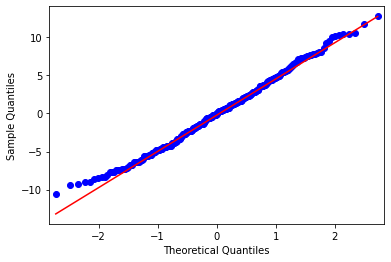

In [154]:
stm.graphics.gofplots.qqplot(anger_mood_model.resid,line='q');

In [155]:
scipy.stats.anderson(anger_mood_model.resid)

AndersonResult(statistic=0.43044544886271296, critical_values=array([0.569, 0.648, 0.777, 0.907, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [156]:
scipy.stats.normaltest(anger_mood_model.resid)

NormaltestResult(statistic=4.839692299736987, pvalue=0.08893529911436146)

### **Pretty good here. Now, as normlaity tests have been passed therefore we will perform parametric homogenity tests.**

#### **Bartlett test**

In [157]:
scipy.stats.bartlett(anger_mood['Anger-Out'],anger_mood['Anger-In'],anger_mood['Control-Out'],anger_mood['Control-In'])

BartlettResult(statistic=1.9996104310731075, pvalue=0.5724875648993066)

#### **Levene test**

In [158]:
scipy.stats.levene(anger_mood['Anger-Out'],anger_mood['Anger-In'],anger_mood['Control-Out'],anger_mood['Control-In'],center='mean')

LeveneResult(statistic=0.9134212779534832, pvalue=0.43472151627992617)

### **Pretty good here as well that means the variances in the groups are also equal.**

#### **White test**

In [159]:
anger_mood_model.model.exog_names

['Intercept',
 'C(Groups)[T.Anger-Out]',
 'C(Groups)[T.Control-In]',
 'C(Groups)[T.Control-Out]',
 'C(Gender)[T.2]',
 'C(Sports)[T.2]']

In [160]:
white_test = het_white(anger_mood_model.resid,anger_mood_model.model.exog)

In [161]:
labels = ['LM Statistic', 'LM-Test p-value', 'F-Statistic', 'F-Test p-value']

In [162]:
dict(zip(labels, white_test))

{'LM Statistic': 12.351023449755298,
 'LM-Test p-value': 0.4179161019156023,
 'F-Statistic': 1.0270228112664146,
 'F-Test p-value': 0.4236543113708347}

#### **Breusch-Pagan test**

In [163]:
bp_test = het_breuschpagan(anger_mood_model.resid,exog_het=anger_mood_model.model.exog)

In [164]:
dict(zip(labels, bp_test))

{'LM Statistic': 6.958054139855664,
 'LM-Test p-value': 0.22377861456398046,
 'F-Statistic': 1.3959815007028675,
 'F-Test p-value': 0.22550477343744865}

### **This model is not heteroskedastic.**

## **`Self_Question:1`**
### **`Does Normality Tests are sensitive to data normalization?`**

#### **Exp-A1**
**Random Data**

In [165]:
rand_data = np.random.lognormal(size=800)
#rand_data = np.random.randint(low=1000,high=4000,size=900)

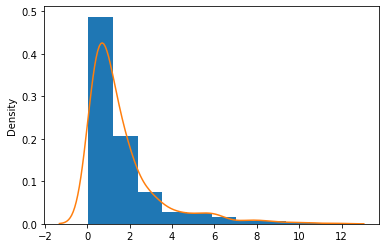

In [166]:
plt.hist(rand_data,density=True)
sns.kdeplot(rand_data);

##### **Perfect example of Power-Law distribution**

In [167]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler

In [168]:
mm=MinMaxScaler()
rb=RobustScaler()

In [169]:
rand_data_pt = pd.DataFrame(scipy.stats.boxcox(rand_data,lmbda=None)[0])[0]
rand_data_pt

0     -0.064057
1     -0.308311
2      0.095681
3     -0.944226
4      0.644085
         ...   
795    0.100683
796   -1.202231
797    0.787827
798    0.048707
799   -1.242496
Name: 0, Length: 800, dtype: float64

In [170]:
rand_data_pt_ss = pd.DataFrame(ss.fit_transform(pd.DataFrame(rand_data_pt)))[0]
rand_data_pt_ss

0     -0.102799
1     -0.344150
2      0.055042
3     -0.972510
4      0.596930
         ...   
795    0.059985
796   -1.227450
797    0.738964
798    0.008626
799   -1.267236
Name: 0, Length: 800, dtype: float64

##### **Mean and Std dev of raw data**

In [171]:
np.mean(rand_data), np.std(rand_data)

(1.6144739825888297, 1.7293429288474458)

##### **Mean and Std dev of power-transformed data**

In [172]:
np.mean(rand_data_pt), np.std(rand_data_pt)

(0.0399775470373607, 1.012024345278867)

##### **Mean and Std dev of standard-scaled power-transformed data**

In [173]:
np.round(np.mean(rand_data_pt_ss),4), np.std(rand_data_pt_ss)

(0.0, 1.0000000000000002)

##### **Distribution of power transformed data**

<AxesSubplot:xlabel='0', ylabel='Density'>

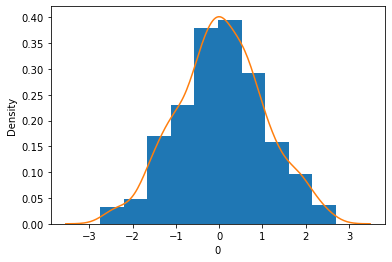

In [174]:
plt.hist(rand_data_pt,density=True)
sns.kdeplot(data=rand_data_pt)

##### **A potential candidate to be named as Normal Distribution.**

##### **Distribution of standard scaled power transformed data**

<AxesSubplot:xlabel='0', ylabel='Density'>

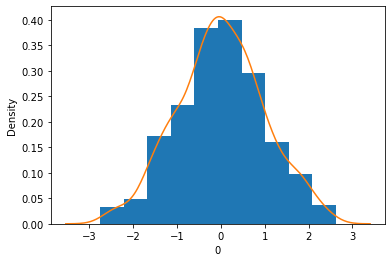

In [175]:
plt.hist(rand_data_pt_ss,density=True)
sns.kdeplot(data=rand_data_pt_ss)

##### **As expected no difference in the distribution plot as compared to power-transformed data distribution.**

#### **Skew Test**

In [176]:
scipy.stats.skew(rand_data), scipy.stats.skewtest(rand_data)

(2.3459241054022066,
 SkewtestResult(statistic=17.022979690349768, pvalue=5.547432176906116e-65))

In [177]:
scipy.stats.skew(rand_data_pt), scipy.stats.skewtest(rand_data_pt)

(-0.004866398297557393,
 SkewtestResult(statistic=-0.056707320257866733, pvalue=0.9547783426788923))

In [178]:
scipy.stats.skew(rand_data_pt_ss), scipy.stats.skewtest(rand_data_pt_ss)

(-0.004866398297557444,
 SkewtestResult(statistic=-0.056707320257866733, pvalue=0.9547783426788923))

#### **Kurtosis Test**

In [179]:
scipy.stats.kurtosis(rand_data), scipy.stats.kurtosistest(rand_data)

(6.508709297907771,
 KurtosistestResult(statistic=10.763290570317, pvalue=5.1304825269906875e-27))

In [180]:
scipy.stats.kurtosis(rand_data_pt), scipy.stats.kurtosistest(rand_data_pt)

(-0.20162655491151105,
 KurtosistestResult(statistic=-1.1820040844875324, pvalue=0.23720408018679096))

In [181]:
scipy.stats.kurtosis(rand_data_pt_ss), scipy.stats.kurtosistest(rand_data_pt_ss)

(-0.20162655491151193,
 KurtosistestResult(statistic=-1.1820040844875377, pvalue=0.23720408018678896))

#### **Shapiro-Wilk Test**

In [182]:
scipy.stats.shapiro(rand_data)

ShapiroResult(statistic=0.7420974373817444, pvalue=1.895059993366704e-33)

In [183]:
scipy.stats.shapiro(rand_data_pt)

ShapiroResult(statistic=0.9968069195747375, pvalue=0.11134199053049088)

In [184]:
scipy.stats.shapiro(rand_data_pt_ss)

ShapiroResult(statistic=0.9968070983886719, pvalue=0.11136817932128906)

#### **Anderson-Darling Test**

In [185]:
scipy.stats.anderson(rand_data)

AndersonResult(statistic=60.137937312830786, critical_values=array([0.573, 0.653, 0.783, 0.913, 1.087]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [186]:
scipy.stats.anderson(rand_data_pt)

AndersonResult(statistic=0.3970273865584204, critical_values=array([0.573, 0.653, 0.783, 0.913, 1.087]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [187]:
scipy.stats.anderson(rand_data_pt_ss)

AndersonResult(statistic=0.3970273865584204, critical_values=array([0.573, 0.653, 0.783, 0.913, 1.087]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

#### **D-Agastino Test**

In [188]:
scipy.stats.normaltest(rand_data)

NormaltestResult(statistic=405.63026143913555, pvalue=8.289109600310493e-89)

In [189]:
scipy.stats.normaltest(rand_data_pt)

NormaltestResult(statistic=1.4003493759160377, pvalue=0.49649856389513625)

In [190]:
scipy.stats.normaltest(rand_data_pt_ss)

NormaltestResult(statistic=1.4003493759160504, pvalue=0.49649856389513314)

#### **QQ Plot**

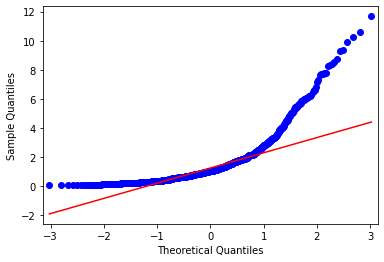

In [191]:
ProbPlot(rand_data).qqplot(line='q');

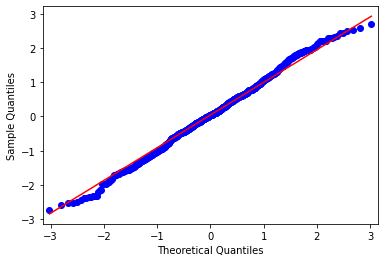

In [192]:
ProbPlot(rand_data_pt).qqplot(line='q');

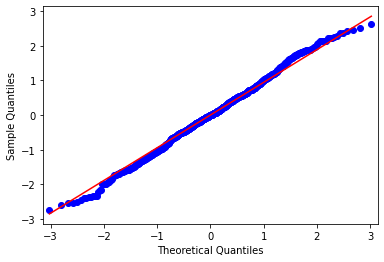

In [193]:
ProbPlot(rand_data_pt_ss).qqplot(line='q');

#### **KS Test**

In [194]:
np.round(np.mean(rand_data),4), np.round(np.std(rand_data),4)

(1.6145, 1.7293)

In [195]:
scipy.stats.kstest(rand_data,cdf='norm')   ## Raw sample data was used

KstestResult(statistic=0.5295834492124549, pvalue=7.748859122469261e-210)

In [196]:
np.round(np.mean(rand_data_pt),4), np.round(np.std(rand_data_pt),4)

(0.04, 1.012)

In [197]:
scipy.stats.kstest(rand_data_pt,cdf='norm') ## Power Transformed Sample Data was used

KstestResult(statistic=0.031698846525372915, pvalue=0.38939706016353903)

In [198]:
np.round(np.mean(rand_data_pt_ss),4), np.round(np.std(rand_data_pt_ss),4)

(0.0, 1.0)

In [199]:
scipy.stats.kstest(rand_data_pt_ss,cdf='norm') ## Standard Scaled Power-Transformed Sample data was used

KstestResult(statistic=0.020000683643091155, pvalue=0.8996731149584402)

### **In this experiment it is quite evident that KS test is very sensitive to the data normalization and even the slightest variation in the mean and std dev can affect the result by a great margin.**

### **In my analysis, I found that KS test focuses more on the sensitivity in the central region of the data with less focus on the tails. This limitation is removed in much improved versions of tests like Anderson-Darling & D'Agastino for large datasets and Shapiro-Wilk for smaller dataset.**

#### **Exp-A2**
**Anger Mood Improvement Dataset**

In [200]:
anger_mood = pd.read_excel('Datasets/angry_moods.xls')

In [201]:
anger_mood.head()

,Gender,Sports,Anger-Out,Anger-In,Control-Out,Control-In,Anger_Expression
0,2,1,18,13,23,20,36
1,2,1,14,17,25,24,30
2,2,1,13,14,28,28,19
3,2,1,17,24,23,23,43
4,1,1,16,17,26,28,27


In [202]:
anger_out_pt = pd.DataFrame(scipy.stats.boxcox(anger_mood['Anger-Out'])[0])[0]

In [203]:
anger_out_pt

0     2.938922
1     2.679492
2     2.603134
3     2.879852
4     2.817242
        ...   
73    2.679492
74    2.333327
75    2.431247
76    2.750638
77    2.750638
Name: 0, Length: 78, dtype: float64

In [204]:
anger_out_pt_ss = pd.DataFrame(ss.fit_transform(pd.DataFrame(scipy.stats.boxcox(anger_mood['Anger-Out'])[0])))[0]

In [205]:
anger_out_pt_ss

0     0.564209
1    -0.406073
2    -0.691656
3     0.343284
4     0.109120
        ...   
73   -0.406073
74   -1.700753
75   -1.334526
76   -0.139982
77   -0.139982
Name: 0, Length: 78, dtype: float64

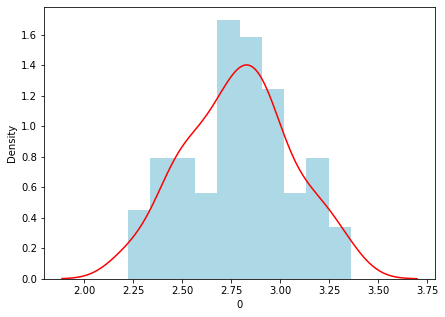

In [206]:
with plt.style.context('seaborn-bright'):
    plt.figure(figsize=(7,5))
    plt.hist(anger_out_pt,density=True,color='lightblue')
    sns.kdeplot(anger_out_pt,color='red')

#### **Skew Test**

In [207]:
scipy.stats.skew(anger_mood['Anger-Out'],bias=False)

0.5856542652644214

In [208]:
scipy.stats.skew(anger_out_pt,bias=False)

-0.0004965443387343199

In [209]:
scipy.stats.skew(anger_out_pt_ss,bias=False)

-0.0004965443387389054

In [210]:
scipy.stats.skewtest(anger_mood['Anger-Out'])

SkewtestResult(statistic=2.114149991165024, pvalue=0.03450245856975766)

In [211]:
scipy.stats.skewtest(anger_out_pt)

SkewtestResult(statistic=-0.0018956488195151877, pvalue=0.998487491980067)

In [212]:
scipy.stats.skewtest(anger_out_pt_ss)

SkewtestResult(statistic=-0.0018956488195325171, pvalue=0.9984874919800533)

#### **Kurtosis Test**

In [213]:
scipy.stats.kurtosis(anger_mood['Anger-Out'],bias=False)

-0.0579720414522944

In [214]:
scipy.stats.kurtosis(anger_out_pt,bias=False)

-0.4424467016261513

In [215]:
scipy.stats.kurtosis(anger_out_pt_ss,bias=False)

-0.4424467016261526

In [216]:
scipy.stats.kurtosistest(anger_mood['Anger-Out'])

KurtosistestResult(statistic=0.08226222673612164, pvalue=0.9344381912761975)

In [217]:
scipy.stats.kurtosistest(anger_out_pt)

KurtosistestResult(statistic=-0.8634396349496412, pvalue=0.38789579550255027)

In [218]:
scipy.stats.kurtosistest(anger_out_pt_ss)

KurtosistestResult(statistic=-0.8634396349496458, pvalue=0.3878957955025477)

#### **Anderson-Darling Test**

In [219]:
scipy.stats.anderson(anger_mood['Anger-Out'])

AndersonResult(statistic=0.8866161999077633, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [220]:
scipy.stats.anderson(anger_out_pt)

AndersonResult(statistic=0.42091177774017297, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [221]:
scipy.stats.anderson(anger_out_pt_ss)

AndersonResult(statistic=0.42091177774017297, critical_values=array([0.55 , 0.626, 0.752, 0.877, 1.043]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

#### **D'Agastino Test**

In [222]:
scipy.stats.normaltest(anger_mood['Anger-Out'])

NormaltestResult(statistic=4.476397259090656, pvalue=0.10665044841294197)

In [223]:
scipy.stats.normaltest(anger_out_pt)

NormaltestResult(statistic=0.7455315966864164, pvalue=0.6888265382707246)

In [224]:
scipy.stats.normaltest(anger_out_pt_ss)

NormaltestResult(statistic=0.7455315966864247, pvalue=0.6888265382707217)

#### **QQ Plot**

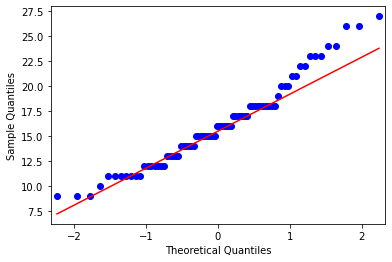

In [225]:
stm.graphics.gofplots.qqplot(data=anger_mood['Anger-Out'],line='q');

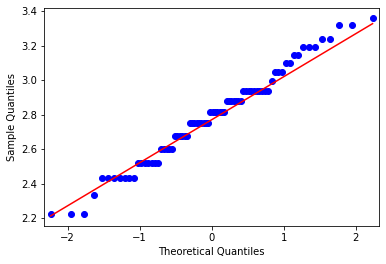

In [226]:
stm.graphics.gofplots.qqplot(data=anger_out_pt,line='q');

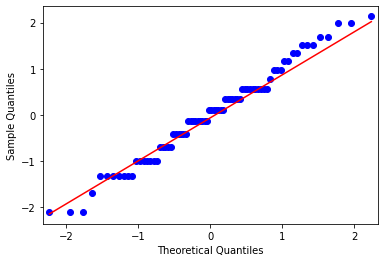

In [227]:
stm.graphics.gofplots.qqplot(data=anger_out_pt_ss,line='q');

#### **CDF Plot**

<AxesSubplot:xlabel='Anger-Out', ylabel='Density'>

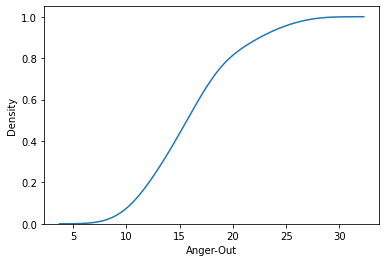

In [228]:
sns.kdeplot(anger_mood['Anger-Out'],cumulative=True)

<AxesSubplot:xlabel='0', ylabel='Density'>

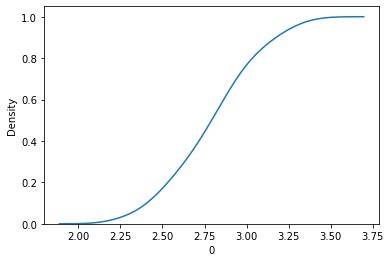

In [229]:
sns.kdeplot(anger_out_pt,cumulative=True)

<AxesSubplot:xlabel='0', ylabel='Density'>

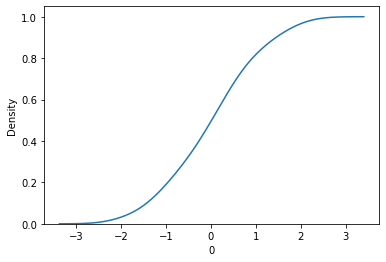

In [230]:
sns.kdeplot(anger_out_pt_ss,cumulative=True)

#### **KS Test**

In [231]:
np.round(np.mean(anger_mood['Anger-Out']),3), np.round(np.std(anger_mood['Anger-Out']),3)

(16.077, 4.19)

In [232]:
scipy.stats.kstest(anger_mood['Anger-Out'],'norm')

KstestResult(statistic=1.0, pvalue=0.0)

In [233]:
np.round(np.mean(anger_out_pt),3), np.round(np.std(anger_out_pt),3)

(2.788, 0.267)

In [234]:
scipy.stats.kstest(anger_out_pt,'norm')

KstestResult(statistic=0.9869662951831715, pvalue=1.889403494844932e-147)

In [235]:
anger_out_pt_ss = pd.DataFrame(ss.fit_transform(pd.DataFrame(anger_out_pt)))[0]

In [236]:
np.round(np.mean(anger_out_pt_ss),3), np.round(np.std(anger_out_pt_ss),3)

(0.0, 1.0)

In [237]:
scipy.stats.kstest(anger_out_pt_ss,'norm')

KstestResult(statistic=0.08117785751780704, pvalue=0.6527048356296961)

### **In this experiment as well, it is quite evident that KS test is very sensitive to the data normalization and even the slightest variation in the mean and std dev can affect the result by a great margin.**

### **In my analysis, I found that KS test focuses more on the sensitivity in the central region of the data with less focus on the tails. This limitation is removed in much improved versions of tests like Anderson-Darling & D'Agastino for large datasets and Shapiro-Wilk for smaller dataset.**

#### **Some calculations**

In [238]:
scipy.stats.norm.ppf(0.975)

1.959963984540054

In [239]:
scipy.stats.norm.ppf(0.95)

1.6448536269514722

In [240]:
scipy.stats.norm.ppf(0.05)

-1.6448536269514729

In [241]:
scipy.stats.norm.ppf(0.025)

-1.9599639845400545

In [242]:
scipy.stats.t.ppf(0.95,df=19)

1.729132811521367

In [243]:
scipy.stats.t.ppf(0.975,df=19)

2.093024054408263

In [244]:
scipy.stats.norm.cdf(1.9599)

0.9749962601845973